# Clustering Premenopausal Subset



In [1]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [2]:
from sensorfabric.athena import athena

In [3]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [4]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [5]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [6]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [7]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptompp_npt s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>10
        and symptoms_recorded<300
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(139829, 3)


In [10]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_npt_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [12]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptompp_npt s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
        and symptoms_recorded<300
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(40664, 3)


In [13]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,nausea,1


In [14]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3052


In [15]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [16]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [19]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [20]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1115


In [21]:
frame.to_csv('premenopausalsymptoms_npt_correct.csv')

In [22]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,nausea,dry_skin,vertigo,anxiety,bloating,chills,...,vaginal_dryness,itchy_skin,ovulation_pain,ovulation,odor,uti,nipple_discharge,yeast_infection,painful_intercourse,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9b22b7d01db71874617a55,1,9,5,0,3,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,5,0,...,2,1,0,0,0,0,0,0,0,0
5fec91a88c7e61fc62131b1c,0,0,0,0,0,1,0,4,0,0,...,0,0,0,0,0,0,0,0,0,0
6022a6fdbea29a1eb66b6fe0,1,0,0,0,0,0,1,4,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
frame.shape

(1115, 45)

In [24]:
data_type = frame[symptoms].dtypes

In [26]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('symptoms_premenopause_npt_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [27]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
27731


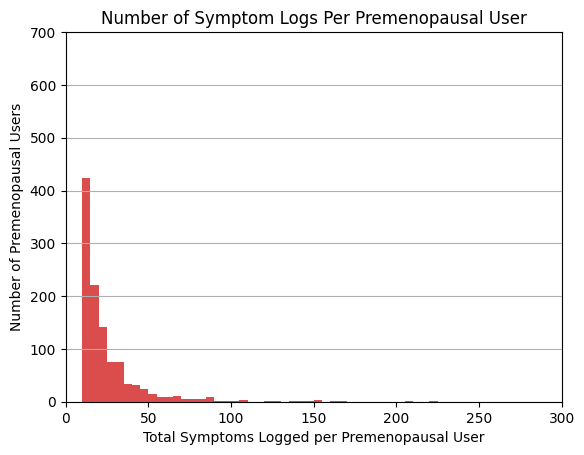

Median Symptoms per User: 17.0
Median Absolute Deviation (MAD) of Symptoms per User: 5.0


In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7,color=(205/255,0,0))
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,700) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [29]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.94%
spotting: 7.44%
cramps: 6.65%
bloating: 6.16%
headaches: 5.78%
anxiety: 5.02%
breast_pain: 4.23%
brain_fog: 3.79%
joint_pain: 3.60%
allergies: 3.34%
mood_swings: 3.10%
dry_skin: 3.02%
muscle_tension: 2.88%
depression: 2.66%
itchy_skin: 2.49%
insomnia: 2.23%
dry_eyes: 2.12%
constipation: 1.94%
ringing_ears: 1.85%
dizzy: 1.79%
hair_loss: 1.76%
facial_hair: 1.69%
brittle_nails: 1.67%
sex_drive: 1.67%
memory_lapse: 1.66%
breast_swelling: 1.51%
diarrhea: 1.28%
tingling_extremeties: 1.23%
nausea: 1.21%
incontinence: 1.12%
irregular_beat: 1.05%
heartburn: 0.91%
chills: 0.88%
odor: 0.86%
ovulation_pain: 0.75%
vaginal_dryness: 0.74%
vertigo: 0.58%
ovulation: 0.58%
uti: 0.23%
yeast_infection: 0.21%
painful_intercourse: 0.17%
vomiting: 0.12%
nipple_discharge: 0.08%
hot_flashes: 0.00%
night_sweats: 0.00%


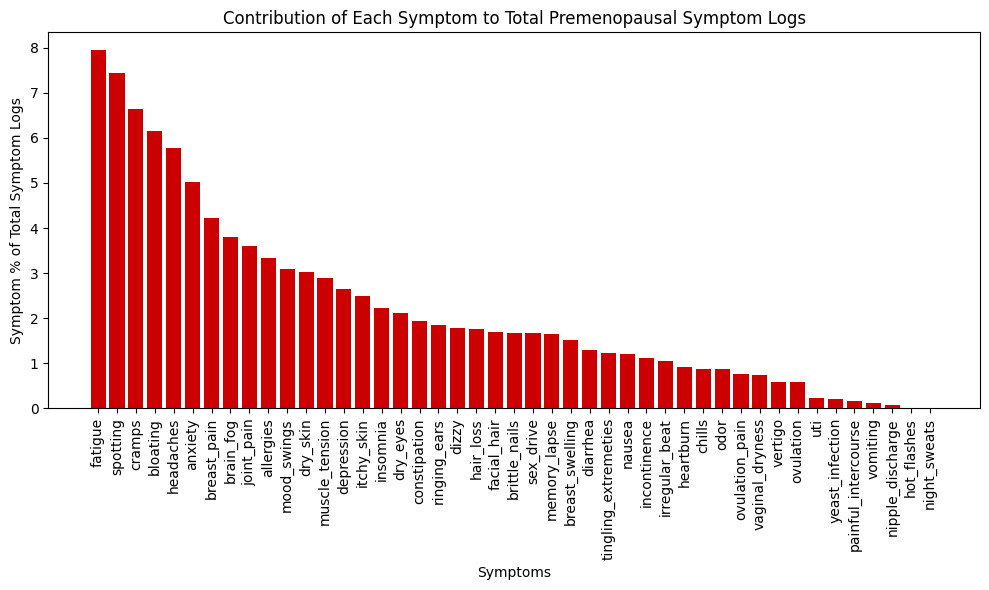

In [30]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values,color=(205/255,0,0))
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [31]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.439462
bloating                60.627803
cramps                  57.309417
headaches               52.645740
anxiety                 52.197309
brain_fog               47.443946
joint_pain              42.869955
mood_swings             40.538117
breast_pain             37.130045
dry_skin                36.681614
depression              36.322870
spotting                35.067265
muscle_tension          34.977578
allergies               34.080717
itchy_skin              32.286996
insomnia                29.417040
facial_hair             28.071749
dry_eyes                26.905830
dizzy                   26.278027
hair_loss               25.650224
constipation            24.394619
sex_drive               24.035874
brittle_nails           23.946188
memory_lapse            23.677130
tingling_extremeties    20.448430
ringing_ears            19.551570
diarrhea                19.551570
nausea                  18.834081
breast_swelling         17.219731
incontinence  

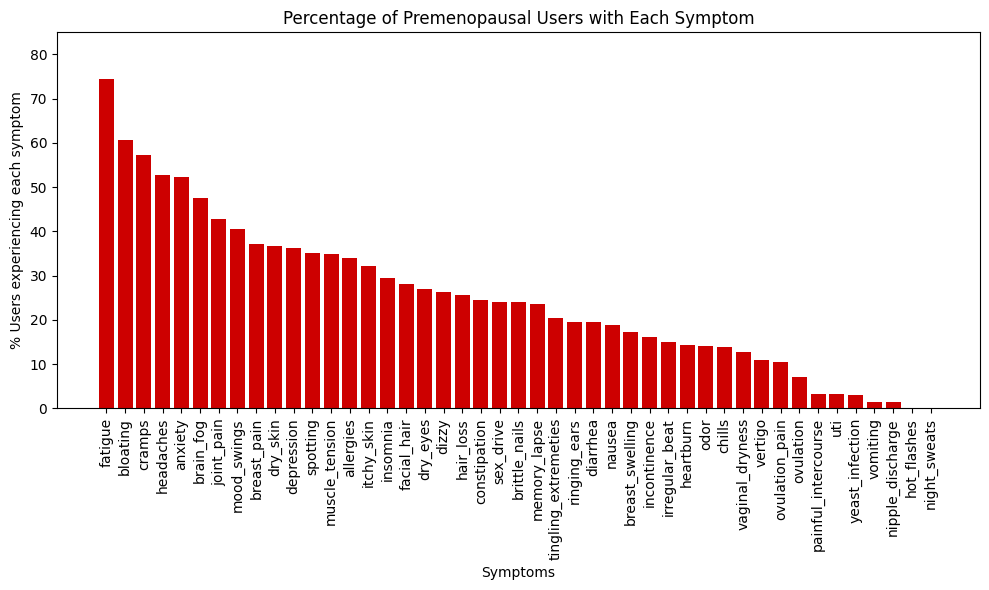

In [33]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values,color=(205/255,0,0))
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.ylim(0,85)
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [34]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


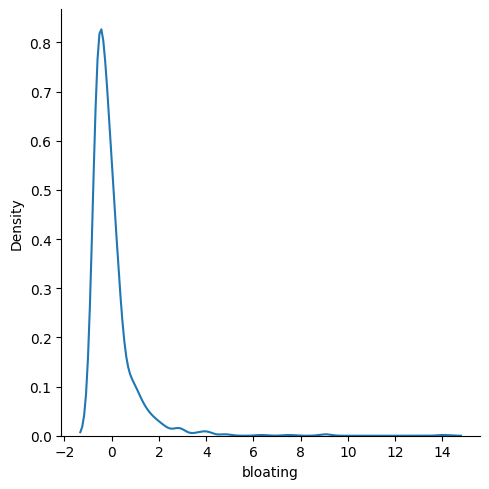

In [35]:
sns.displot(sframe, x='bloating', kind='kde')

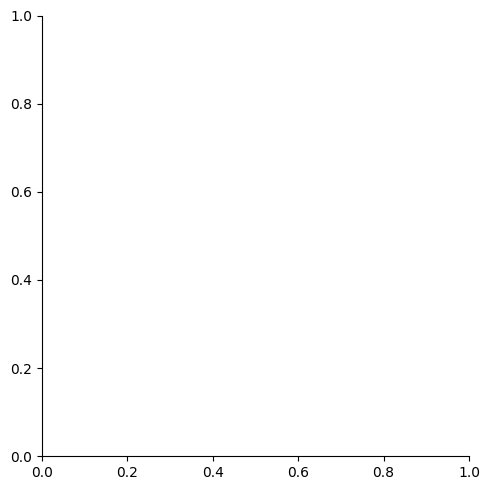

In [36]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [37]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [38]:
cmatrix.to_csv('premeno_npt_correct_symptom_covariance.csv', index=True)

In [40]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('premeno_npt_lenient_symptom_covariance.png')

## Find pairs of symptoms with more than 80% corelation.

In [42]:
import pandas as pd
import plotly.express as px

th = 0.4

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


          Symptom1        Symptom2  Covariance
3        brain_fog    memory_lapse    0.502118
7     memory_lapse       brain_fog    0.502118
0          anxiety        insomnia    0.480192
6         insomnia         anxiety    0.480192
10       ovulation             uti    0.425370
12             uti       ovulation    0.425370
1          anxiety     mood_swings    0.419005
8      mood_swings         anxiety    0.419005
2        brain_fog         fatigue    0.409794
5          fatigue       brain_fog    0.409794
9      mood_swings        vomiting    0.407808
13        vomiting     mood_swings    0.407808
4     constipation  ovulation_pain    0.407105
11  ovulation_pain    constipation    0.407105


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

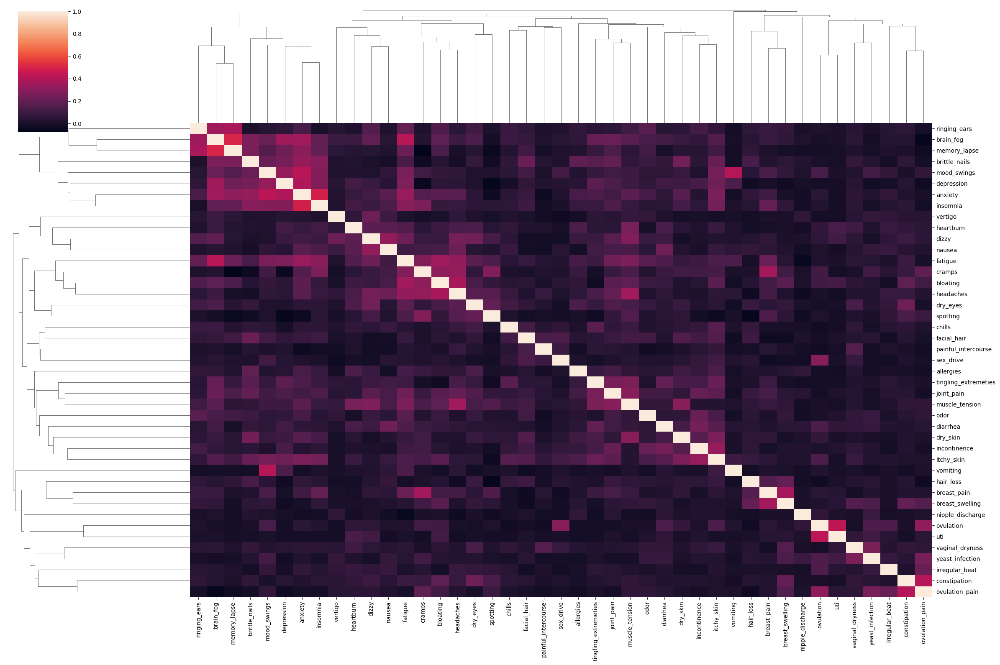

In [43]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [44]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [45]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 10


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [46]:
hcluster.savefig('premeno_npt_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [47]:
from sklearn.decomposition import PCA

In [48]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [49]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [50]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [51]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.34, 0.34
PCA2 - 0.13, 0.46
PCA3 - 0.06, 0.52
PCA4 - 0.06, 0.58
PCA5 - 0.04, 0.63
PCA6 - 0.04, 0.66
PCA7 - 0.03, 0.70
PCA8 - 0.03, 0.73
PCA9 - 0.03, 0.76
PCA10 - 0.02, 0.78
PCA11 - 0.02, 0.80
PCA12 - 0.02, 0.82
PCA13 - 0.02, 0.84
PCA14 - 0.01, 0.85
PCA15 - 0.01, 0.86


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [54]:
pcacomponents = pca.fit_transform(X)

In [55]:
pcacomponents.shape

(1115, 15)

In [56]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

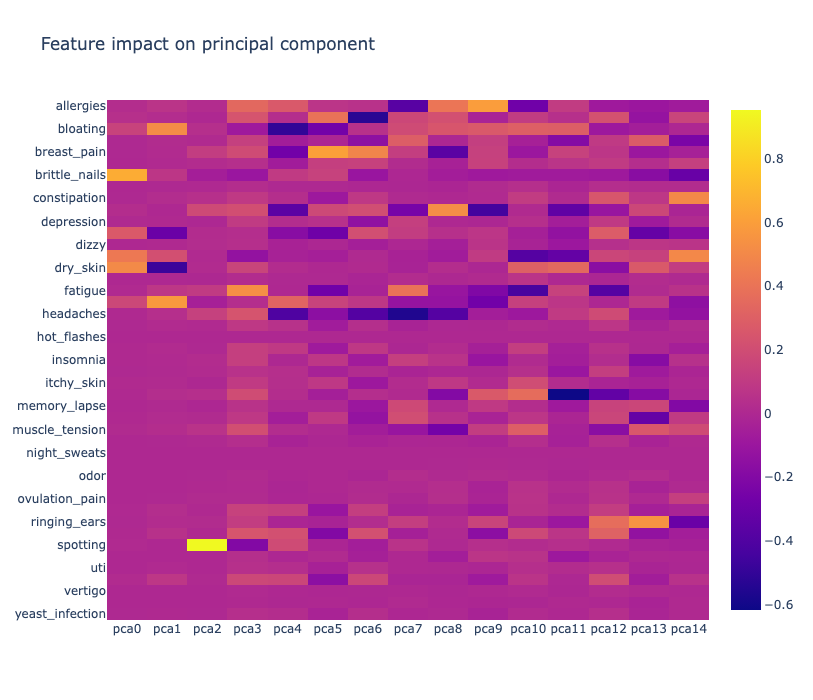

In [57]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

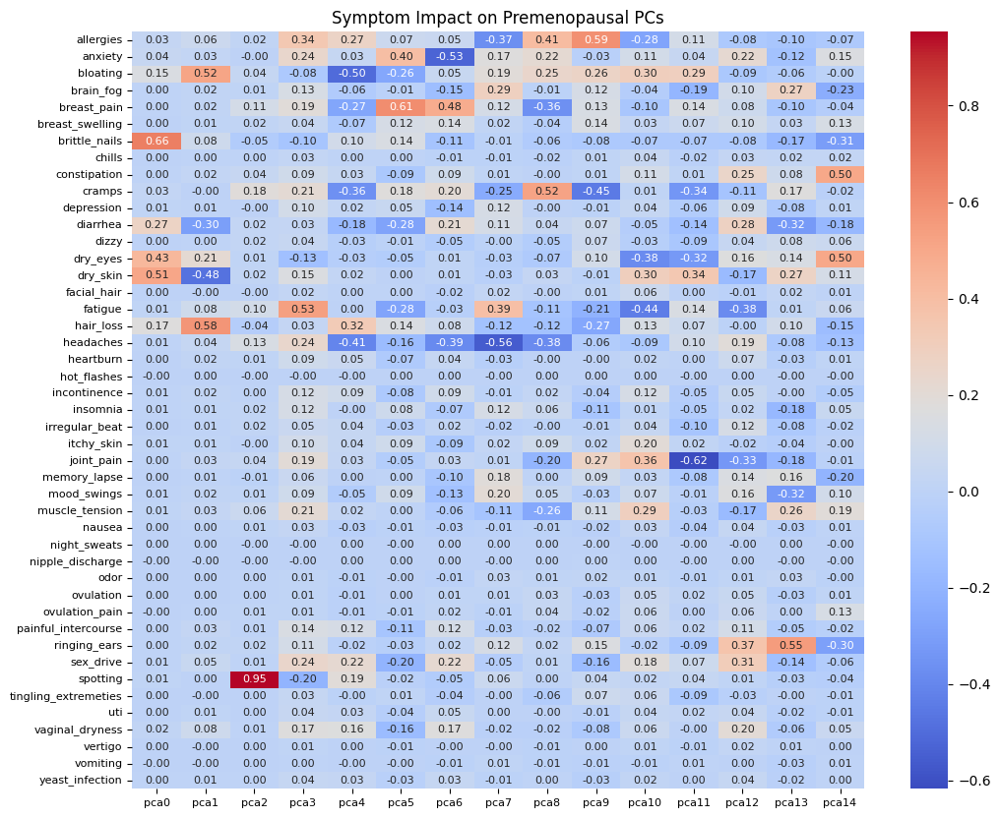

In [58]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [59]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [60]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [61]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

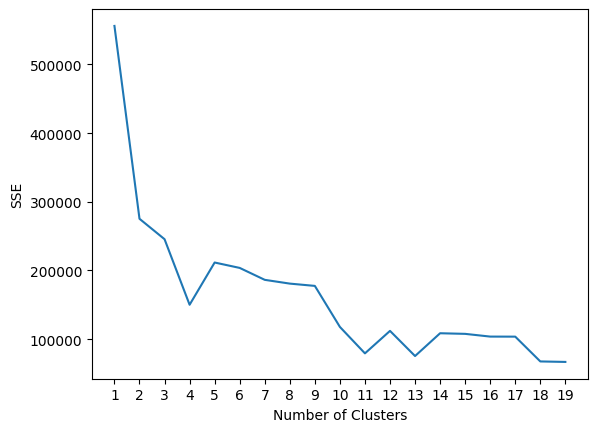

In [62]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [63]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [64]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

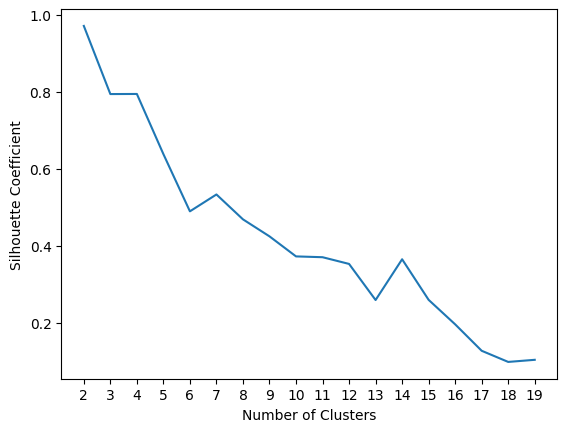

In [65]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [66]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [67]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [68]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [69]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [71]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [70]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [72]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Non Menopausal Subset



In [12]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [13]:
from sensorfabric.athena import athena

In [14]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [15]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [16]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [17]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [18]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>25
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


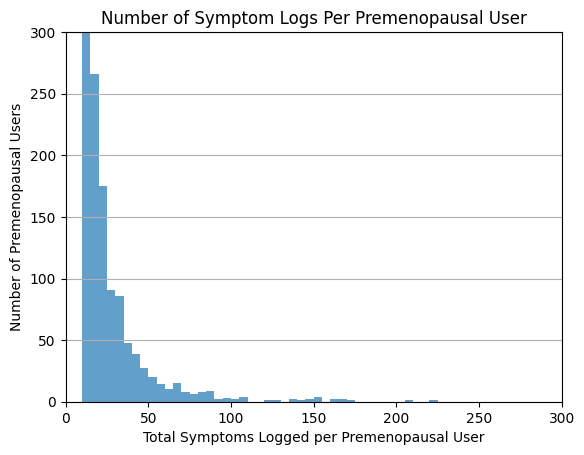

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


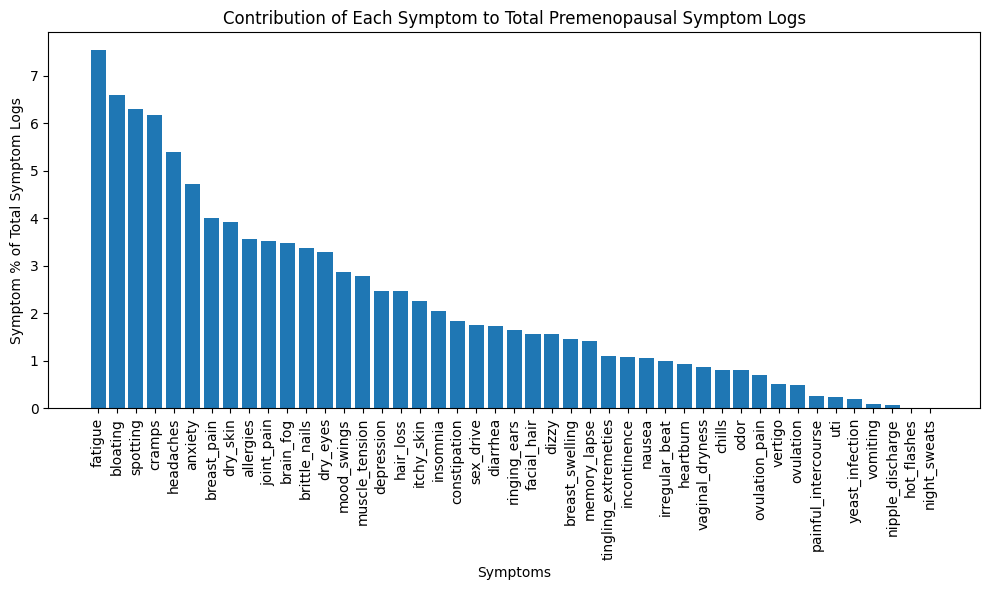

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

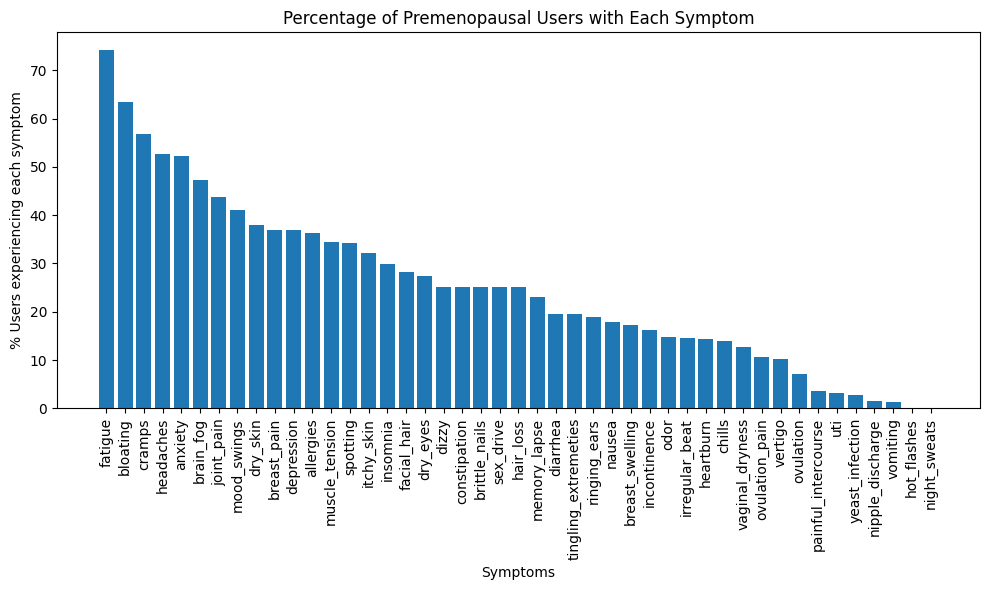

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



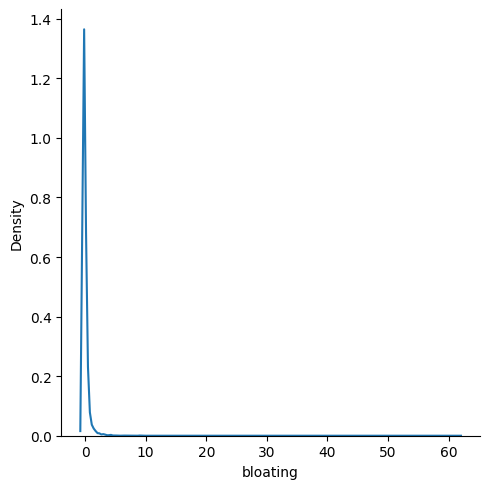

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

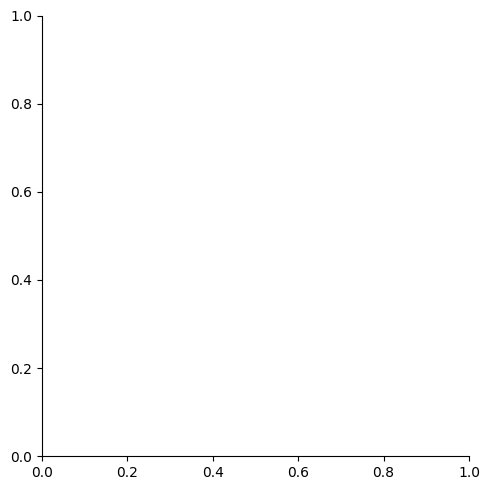

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

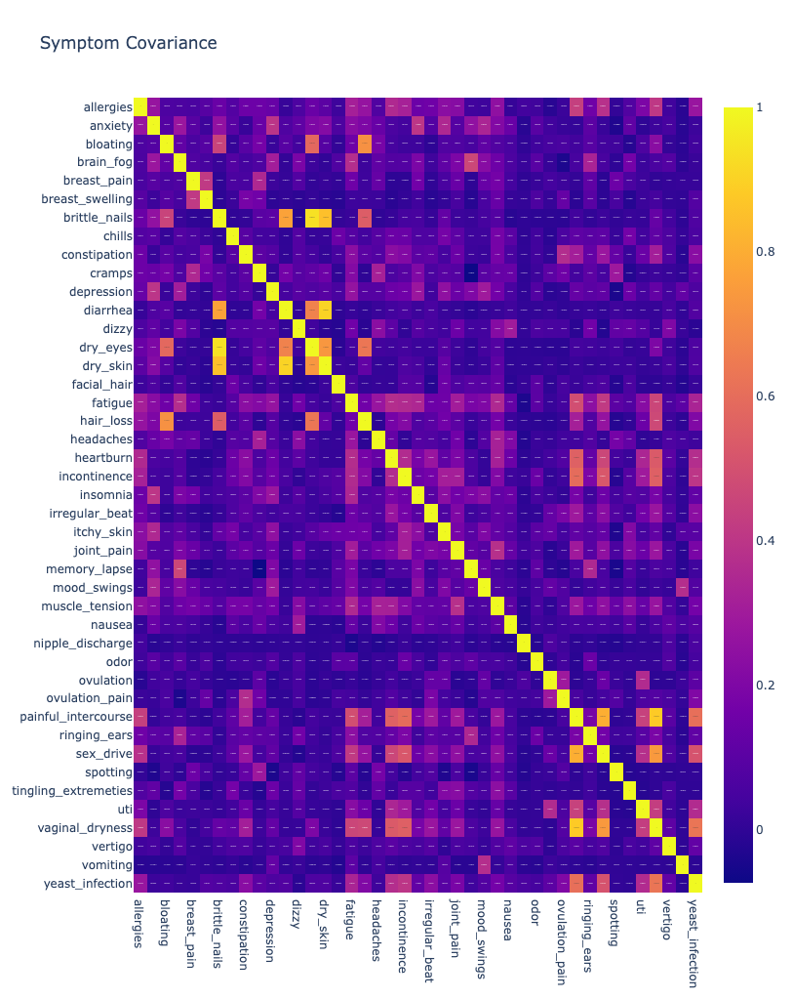

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

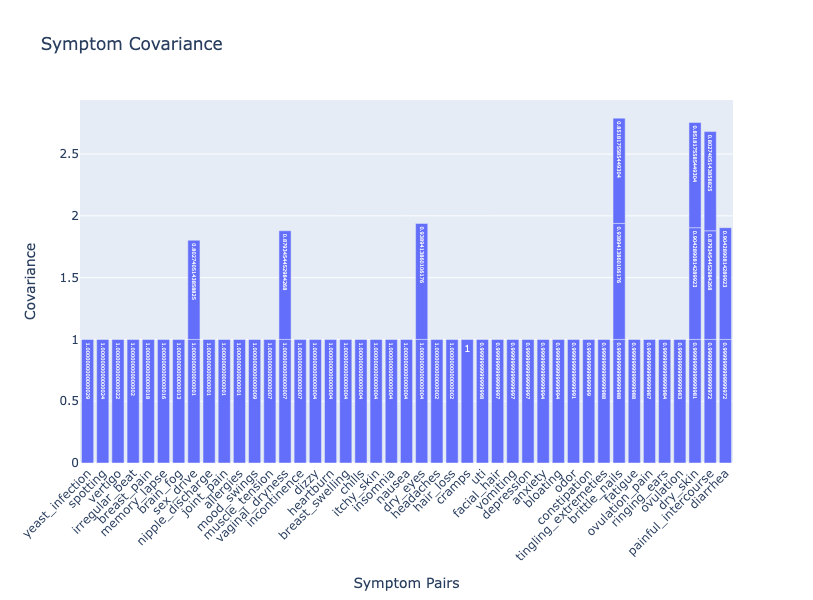

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

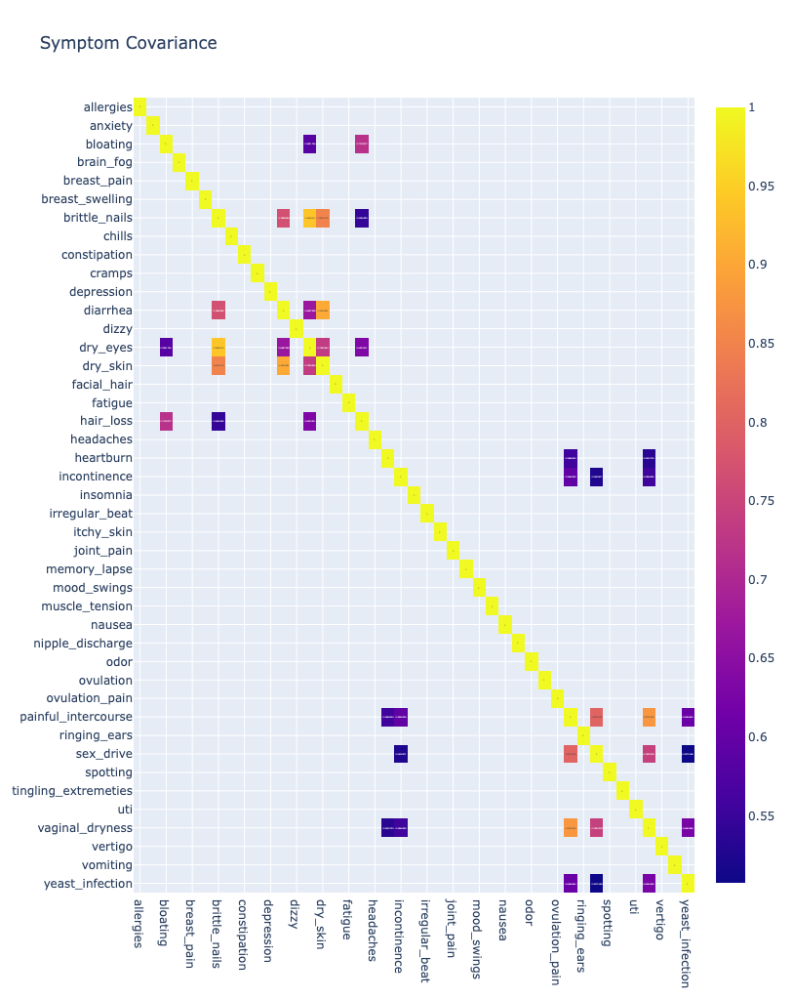

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


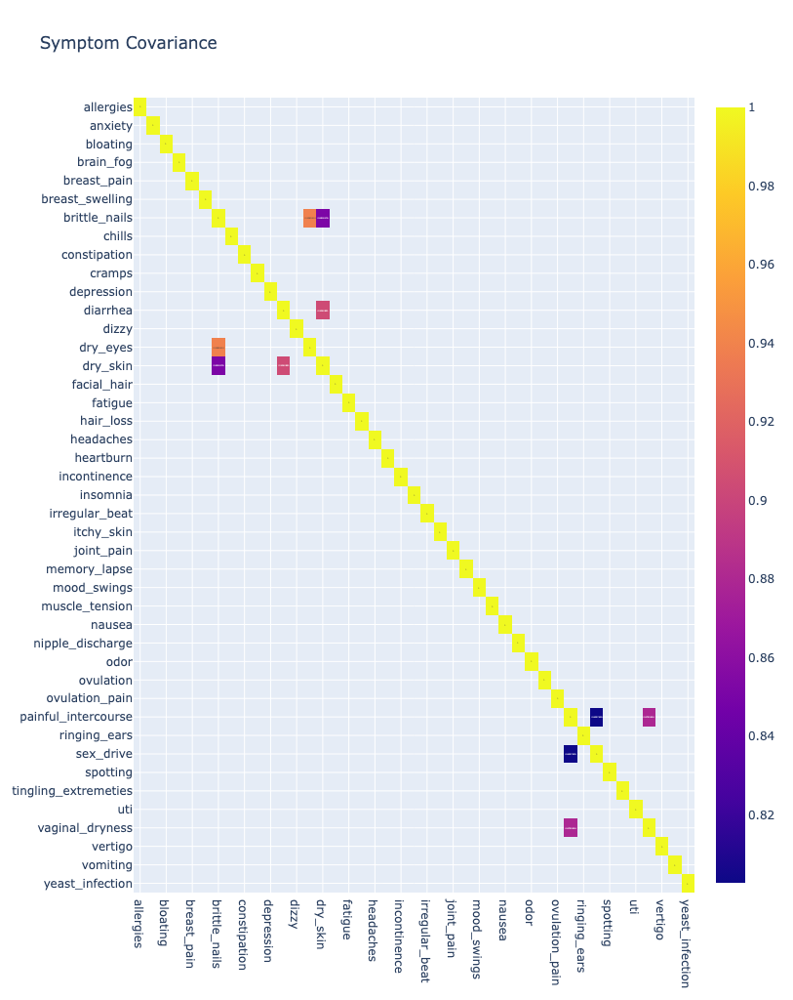

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

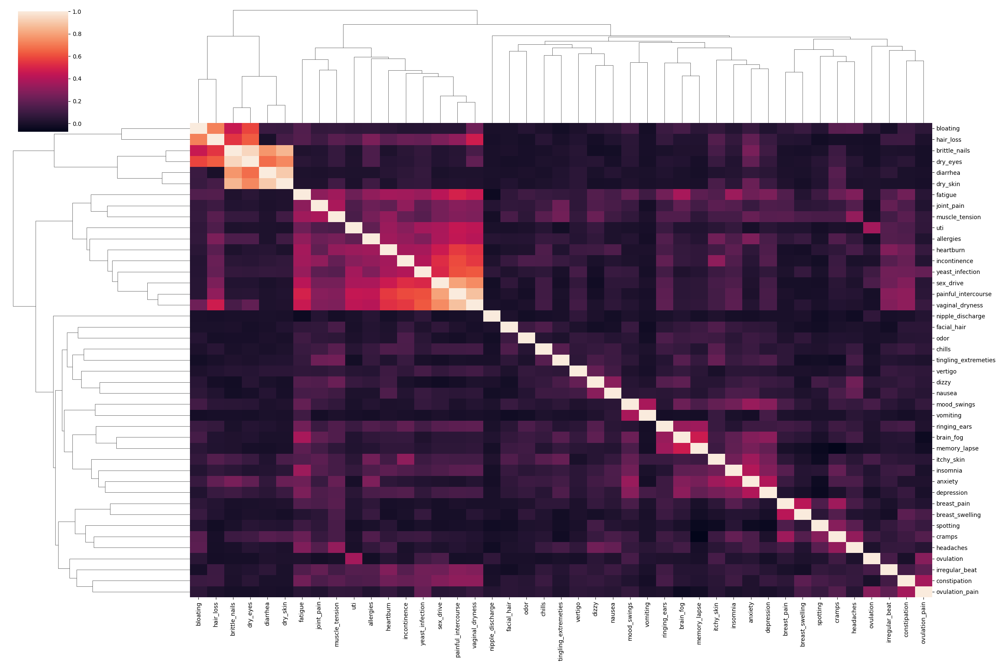

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

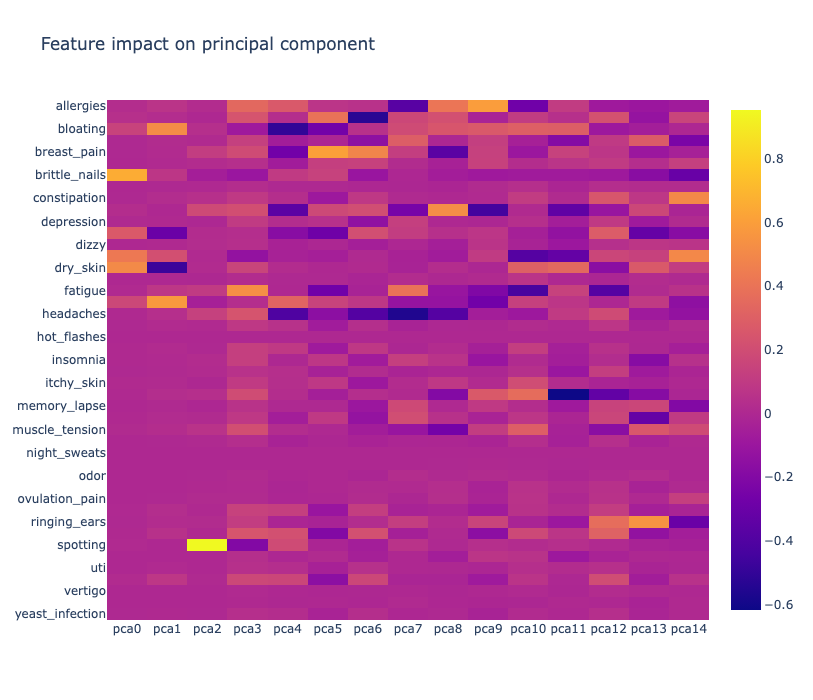

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

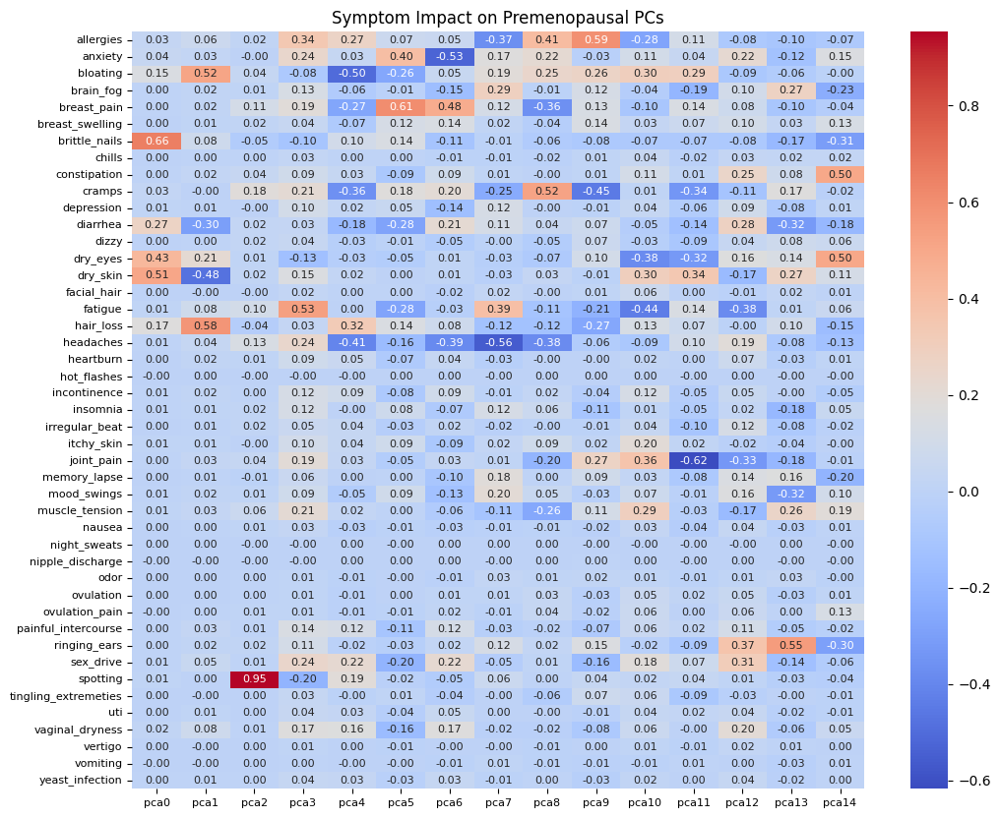

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

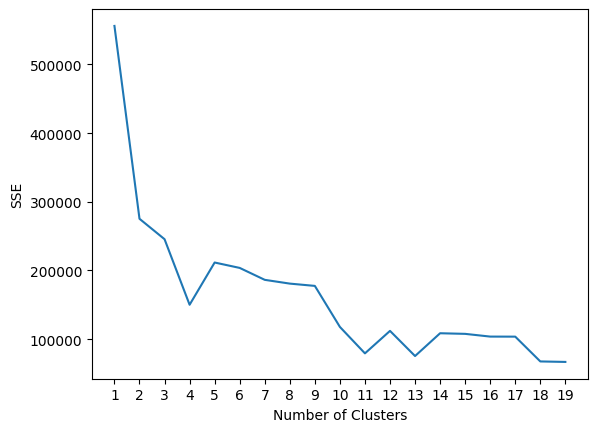

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

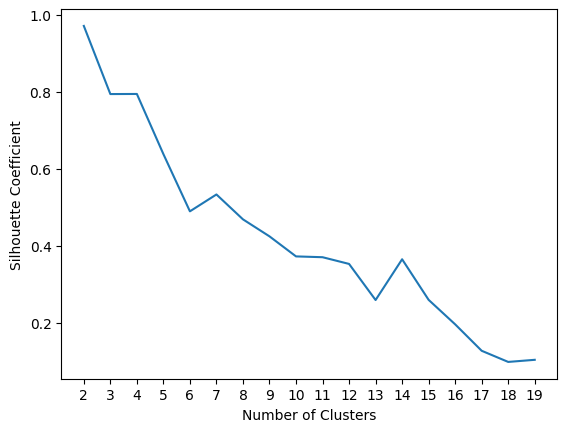

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Premenopausal Subset



In [3]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [4]:
from sensorfabric.athena import athena

In [5]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [6]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [7]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [8]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [9]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptomspp s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>10
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptomspp s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


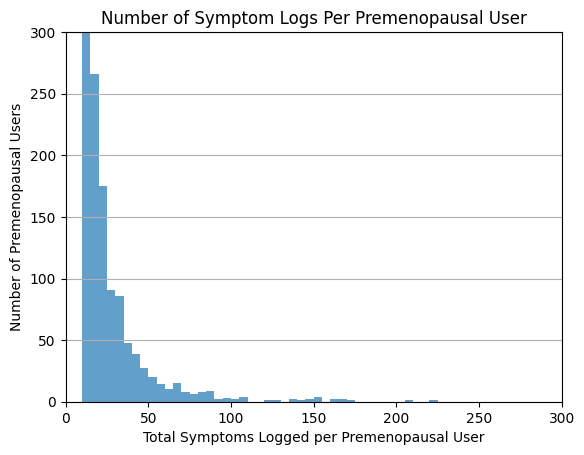

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


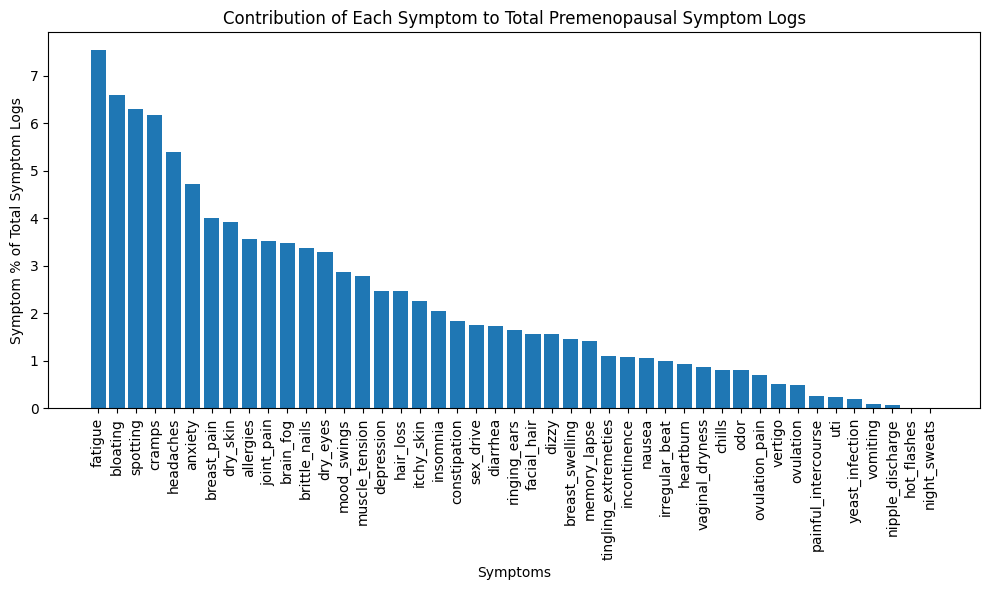

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

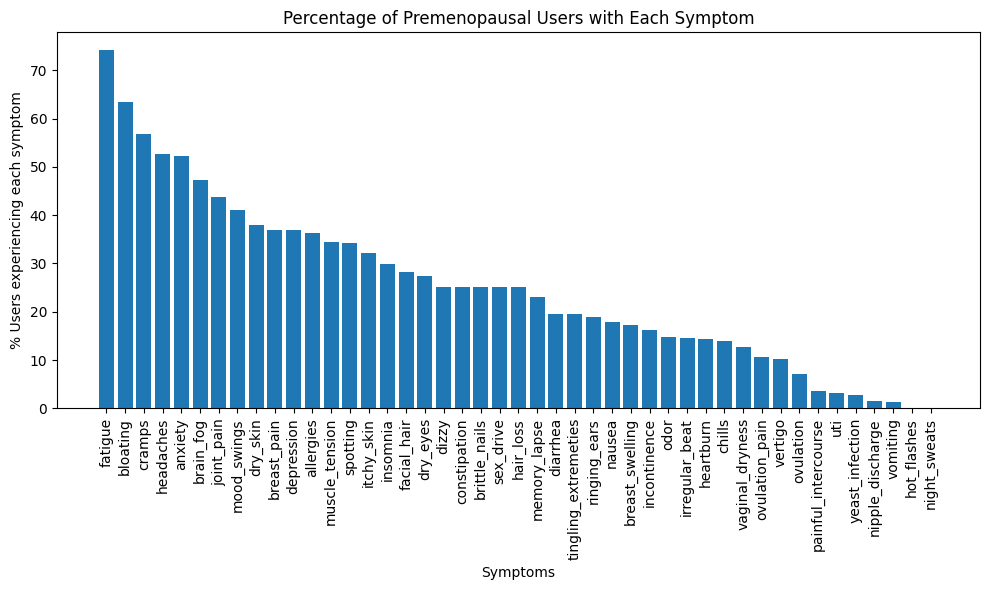

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



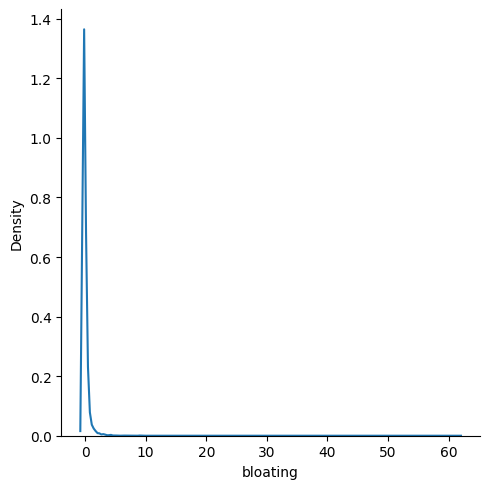

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

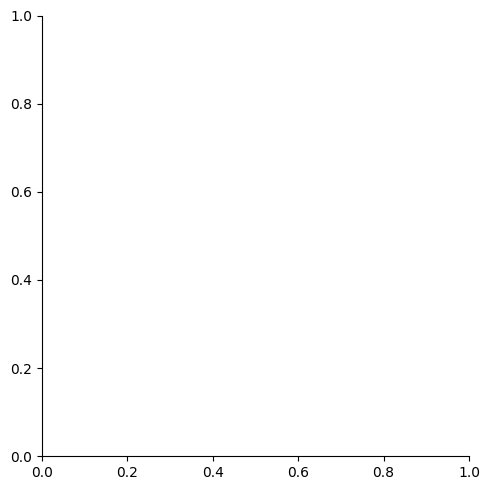

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

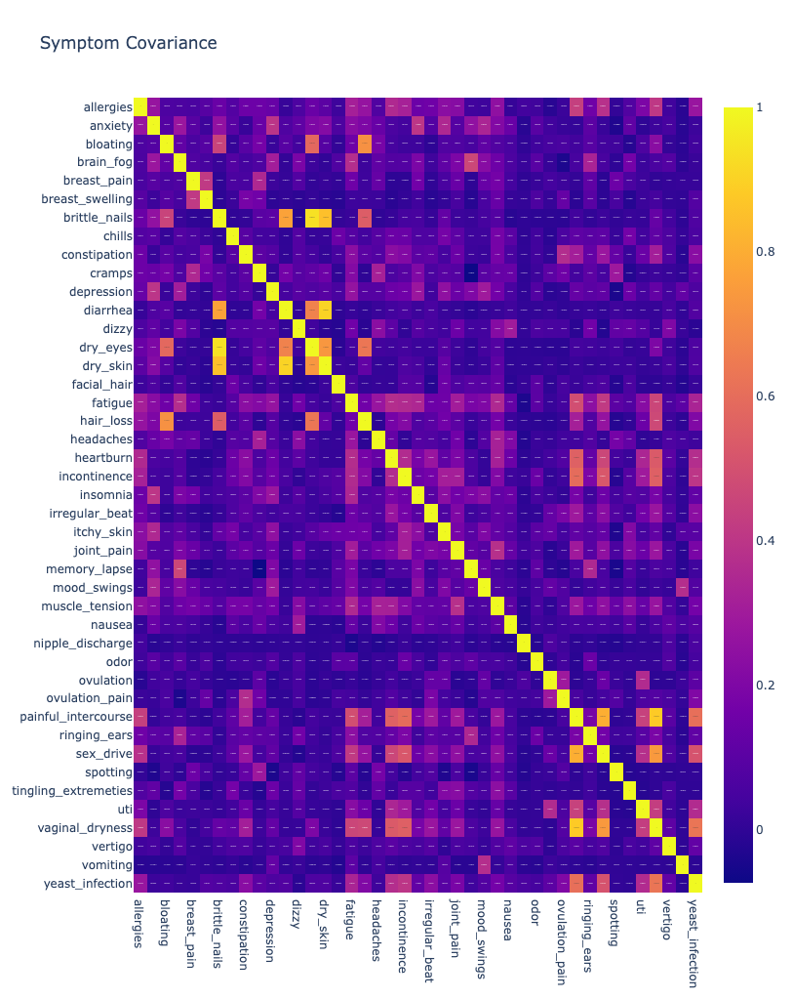

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

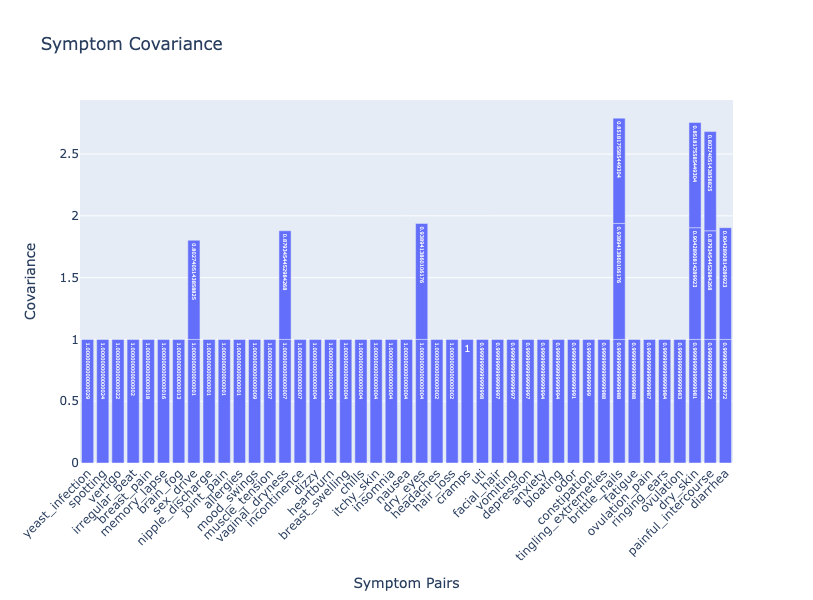

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

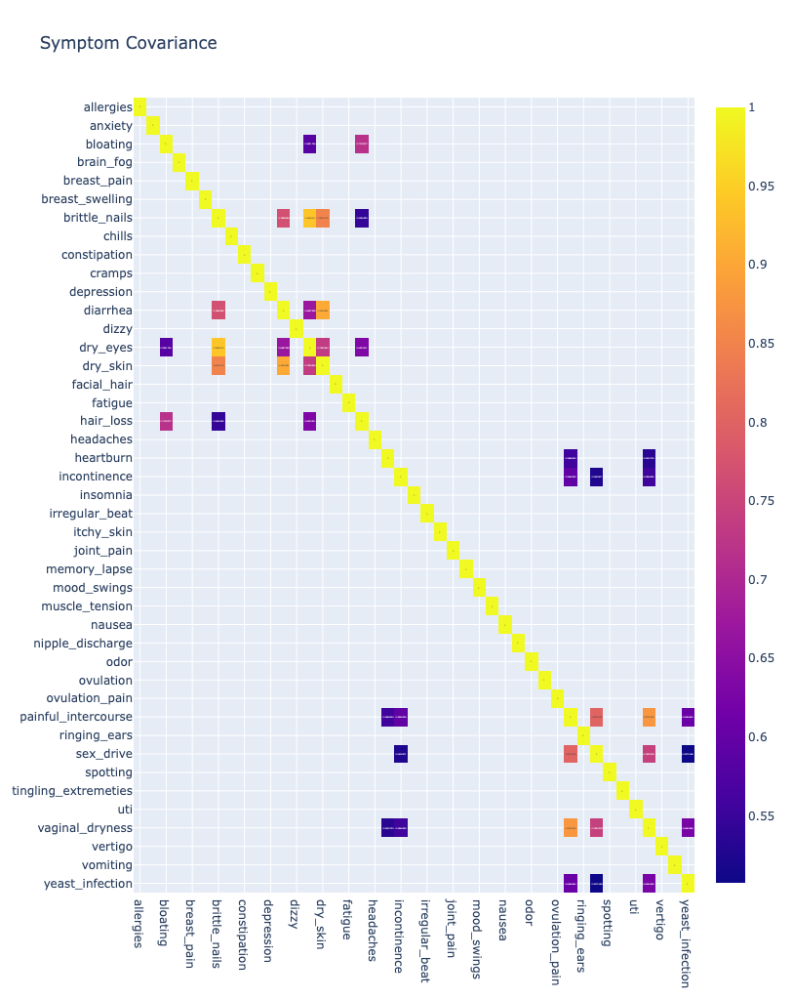

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


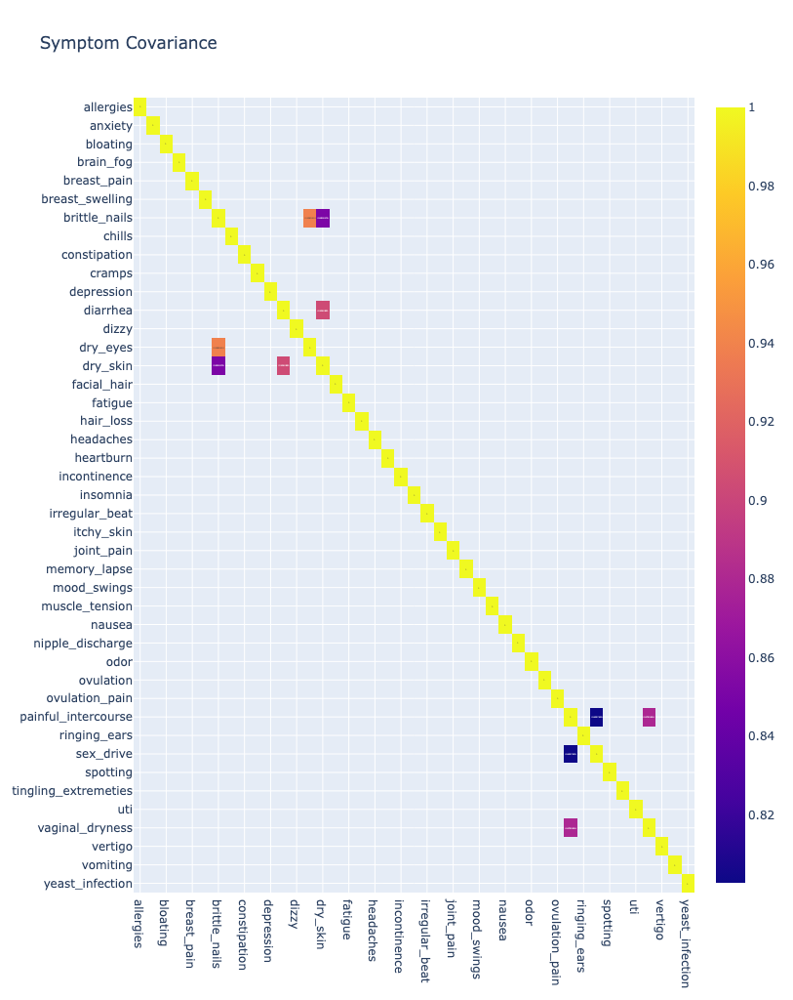

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

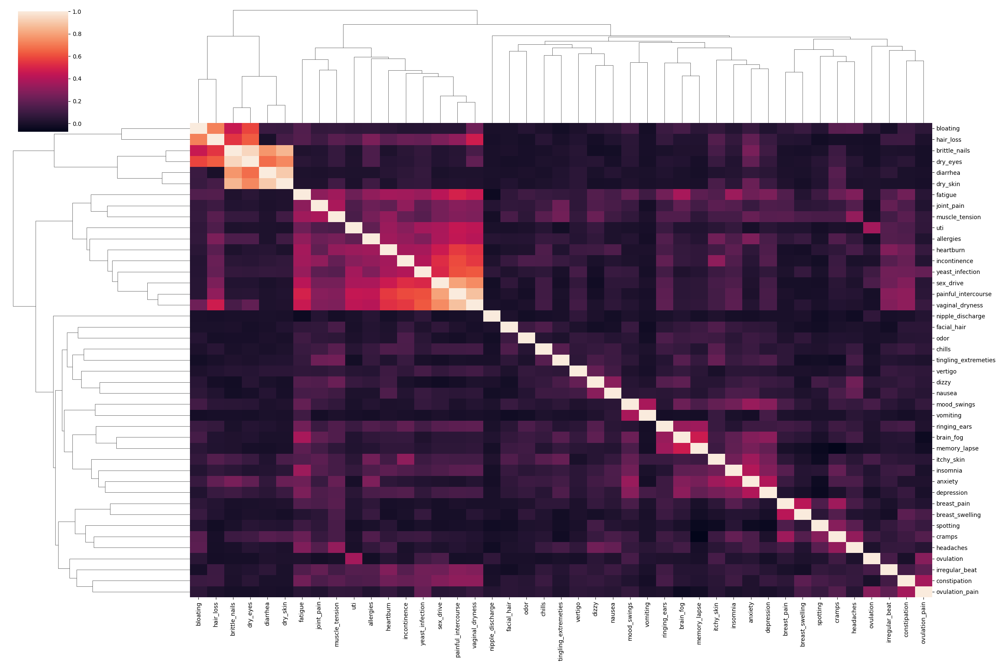

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

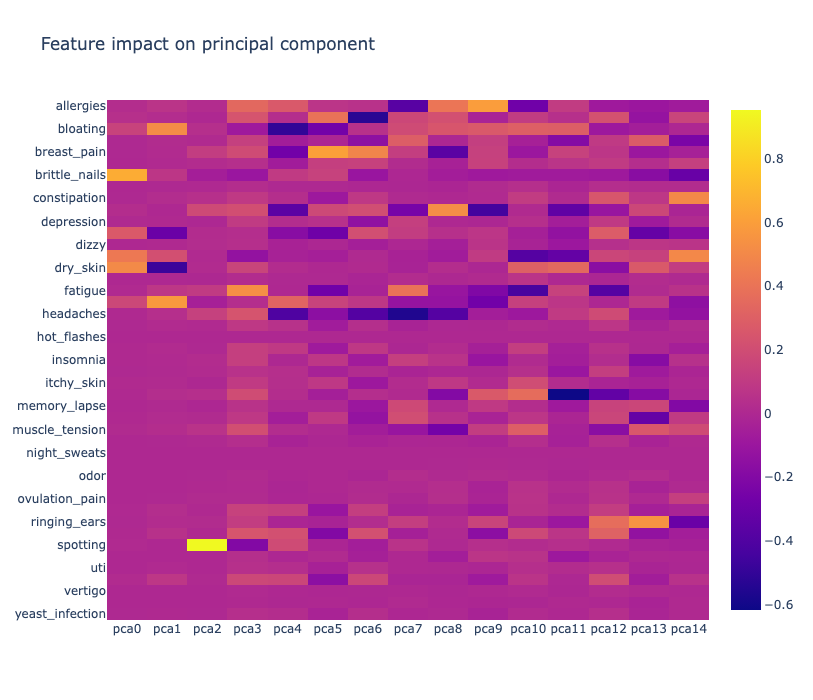

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

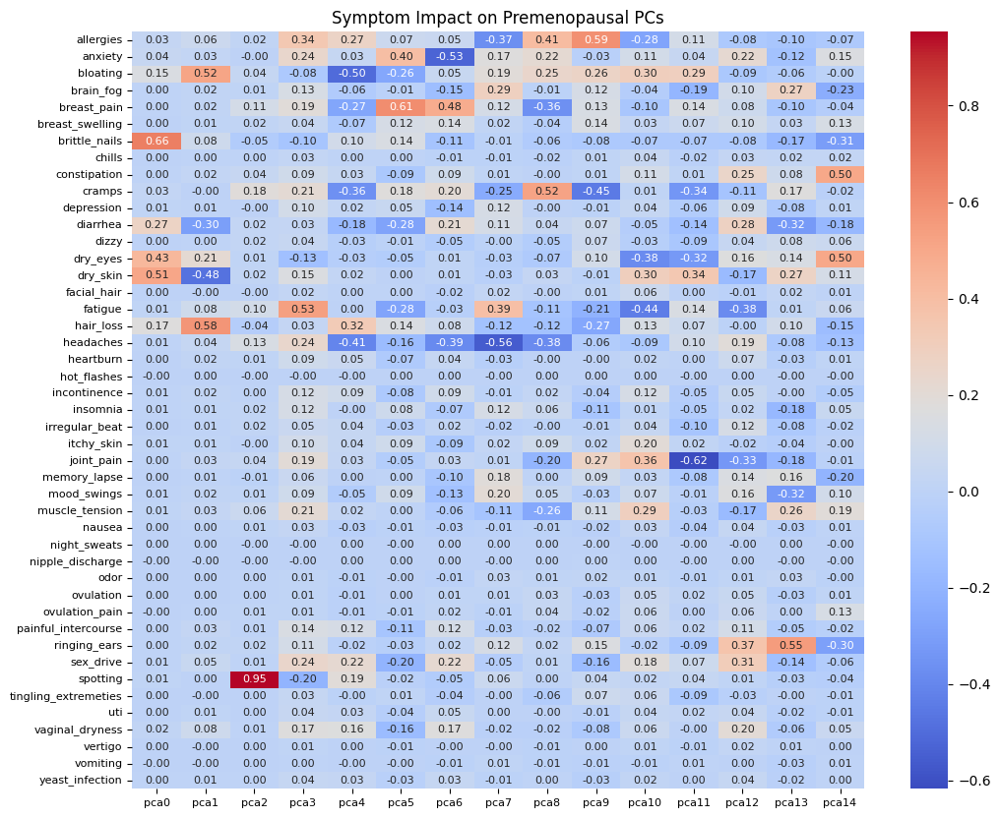

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

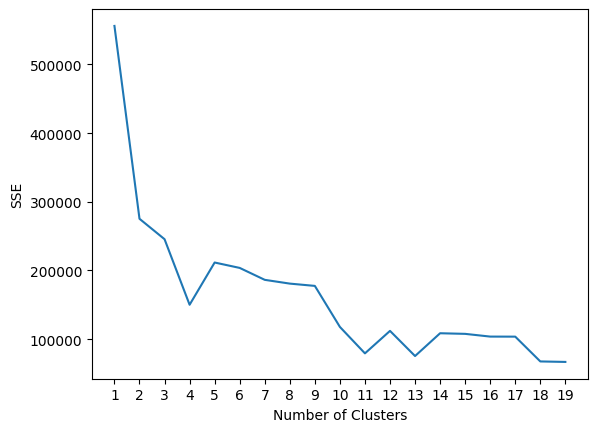

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

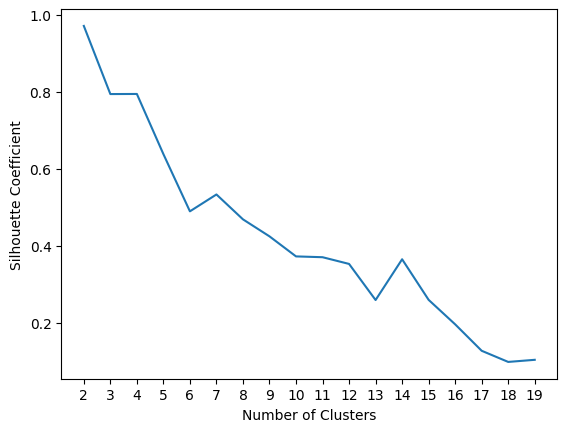

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Non Menopausal Subset



In [12]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [13]:
from sensorfabric.athena import athena

In [14]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [15]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [16]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [17]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [18]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>25
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


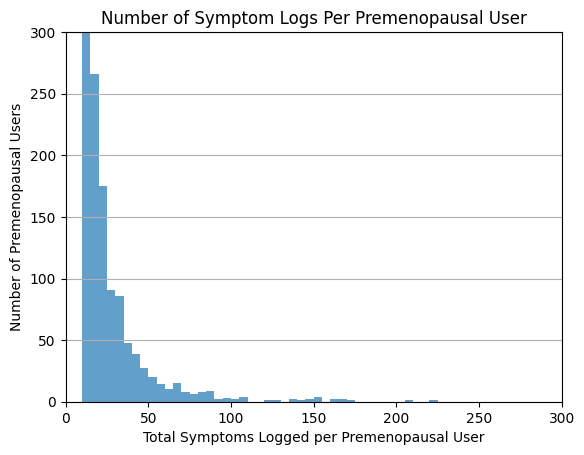

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


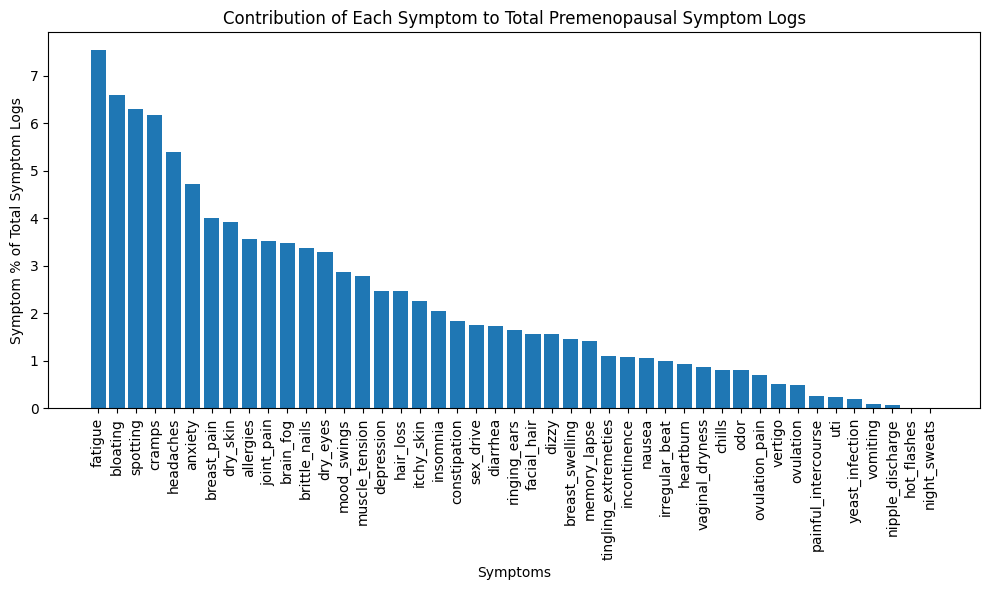

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

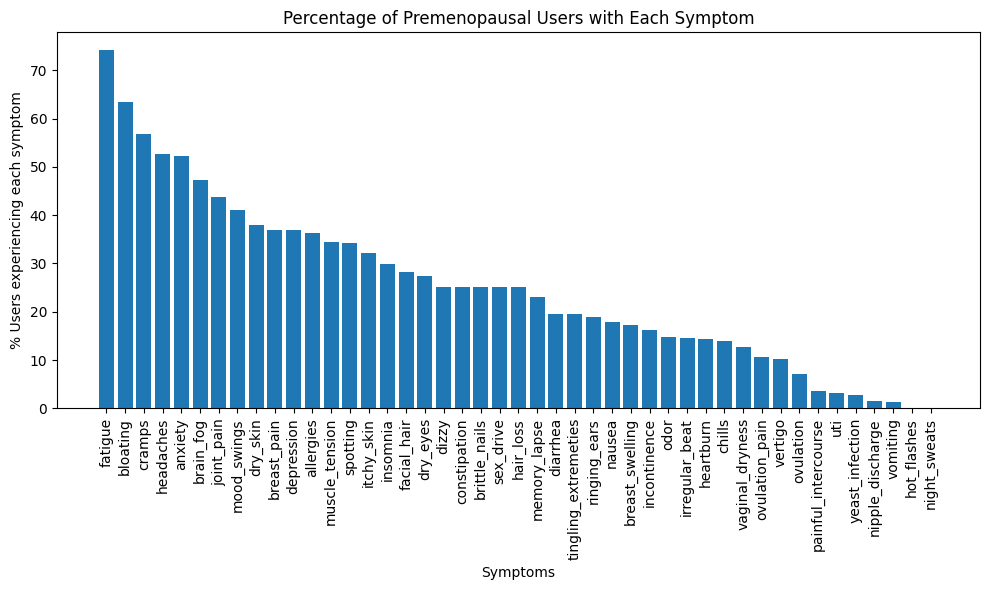

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



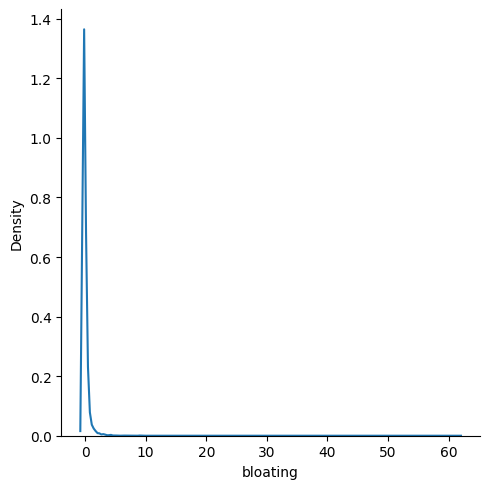

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

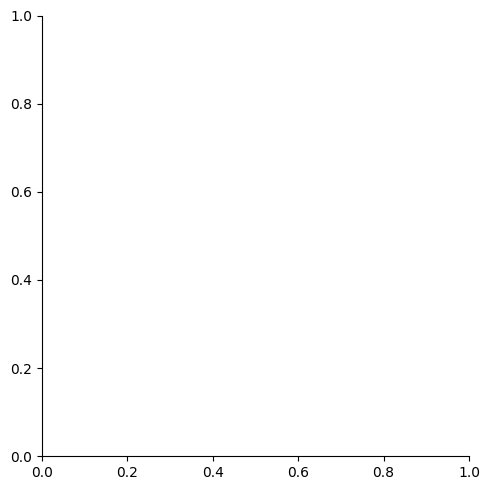

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

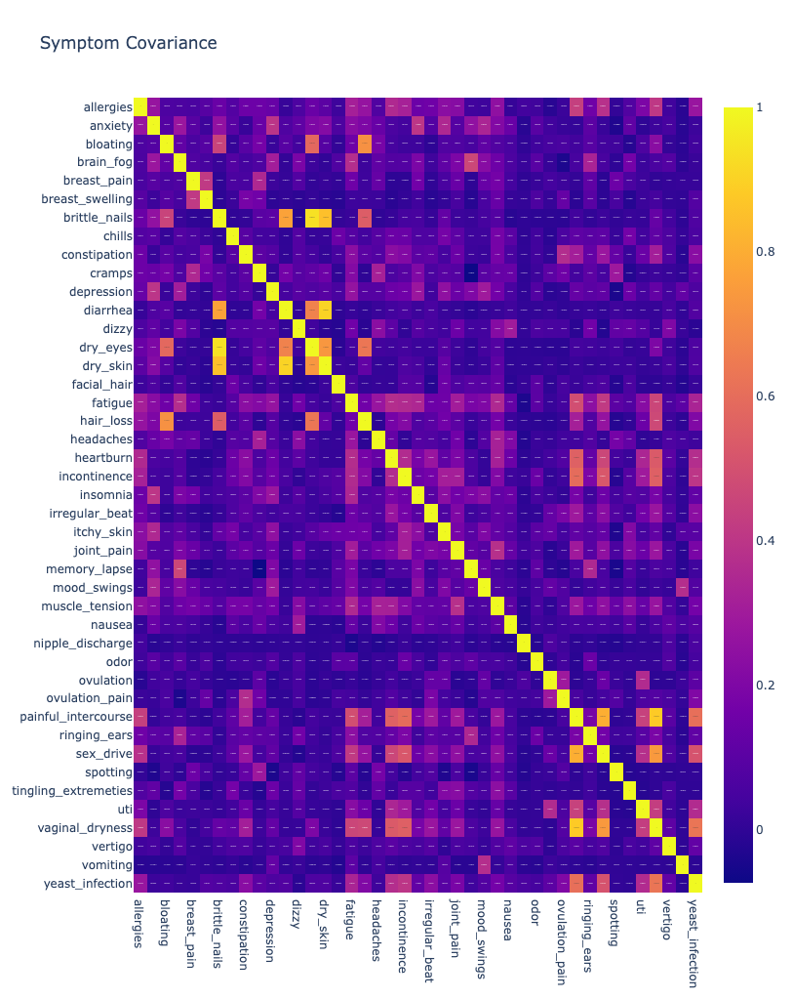

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

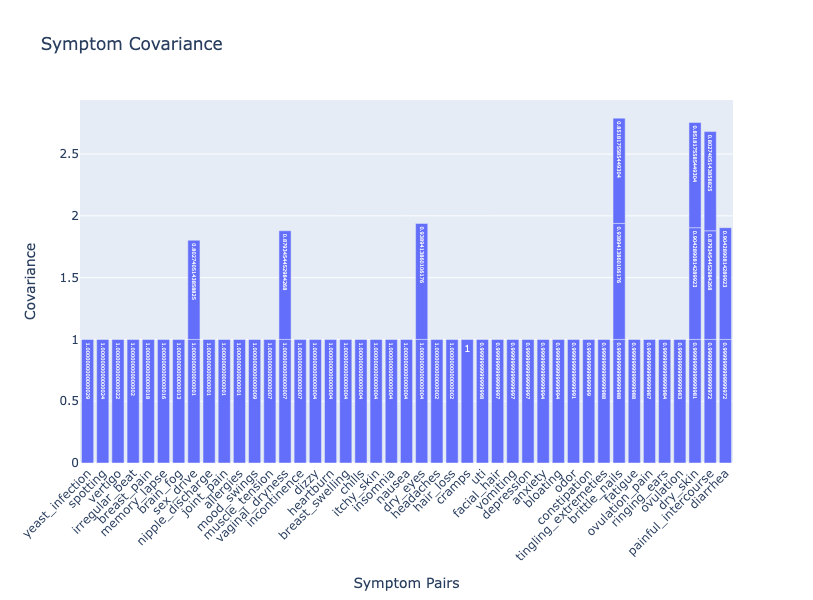

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

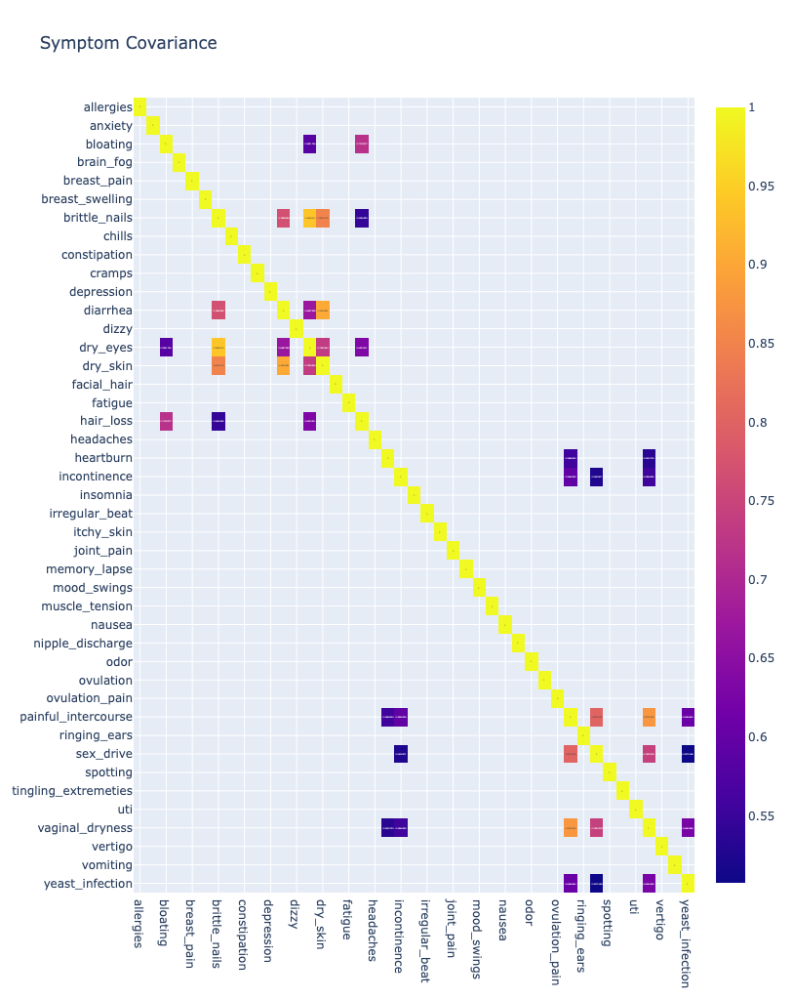

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


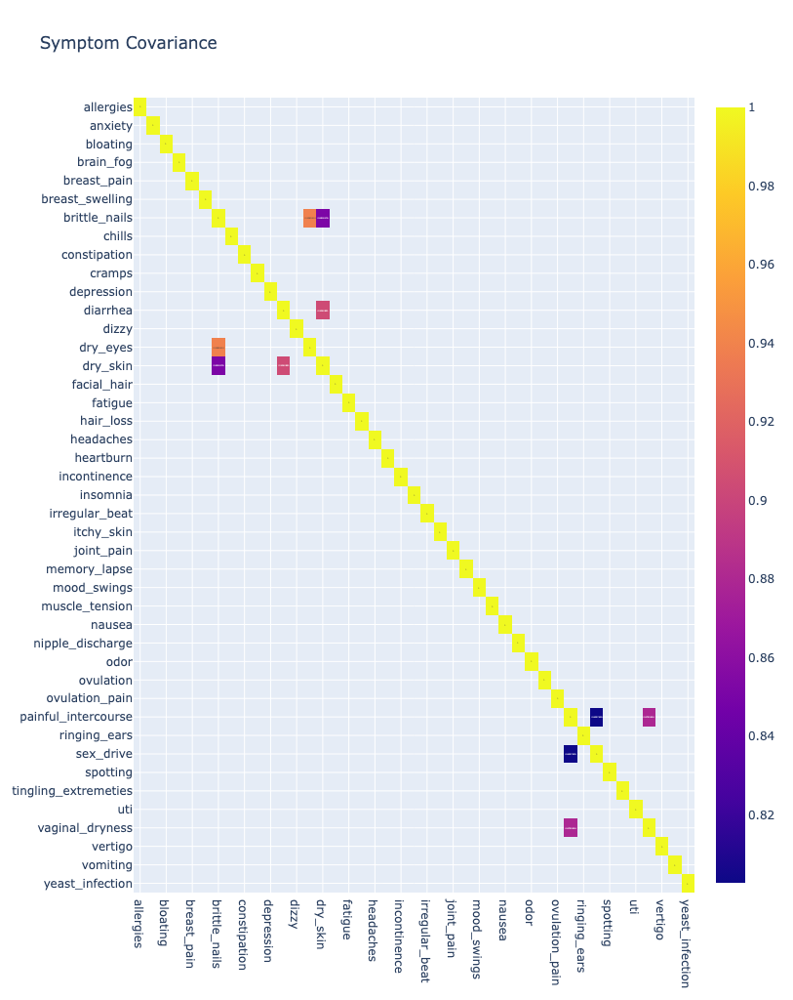

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

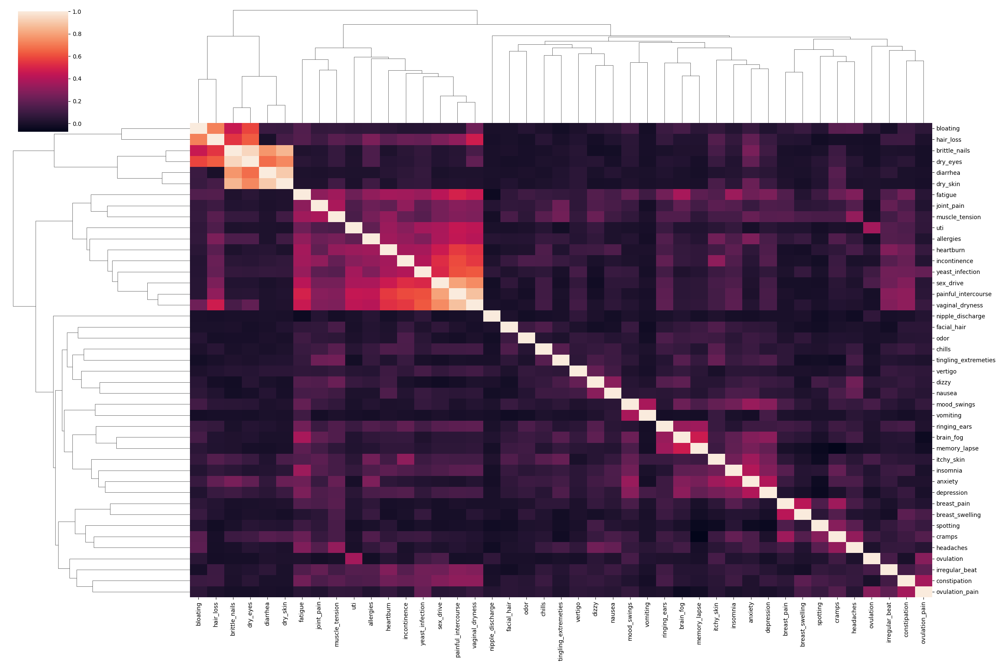

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

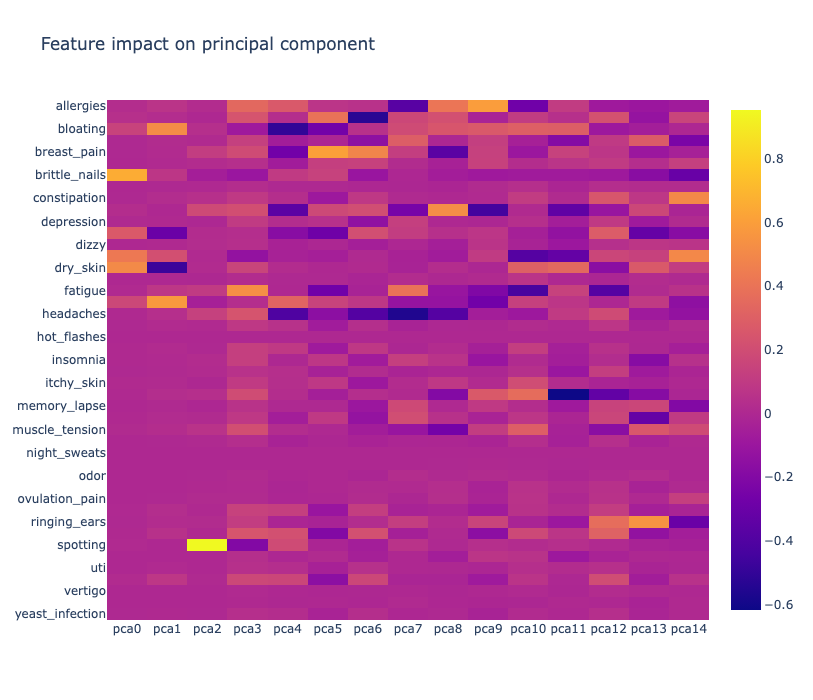

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

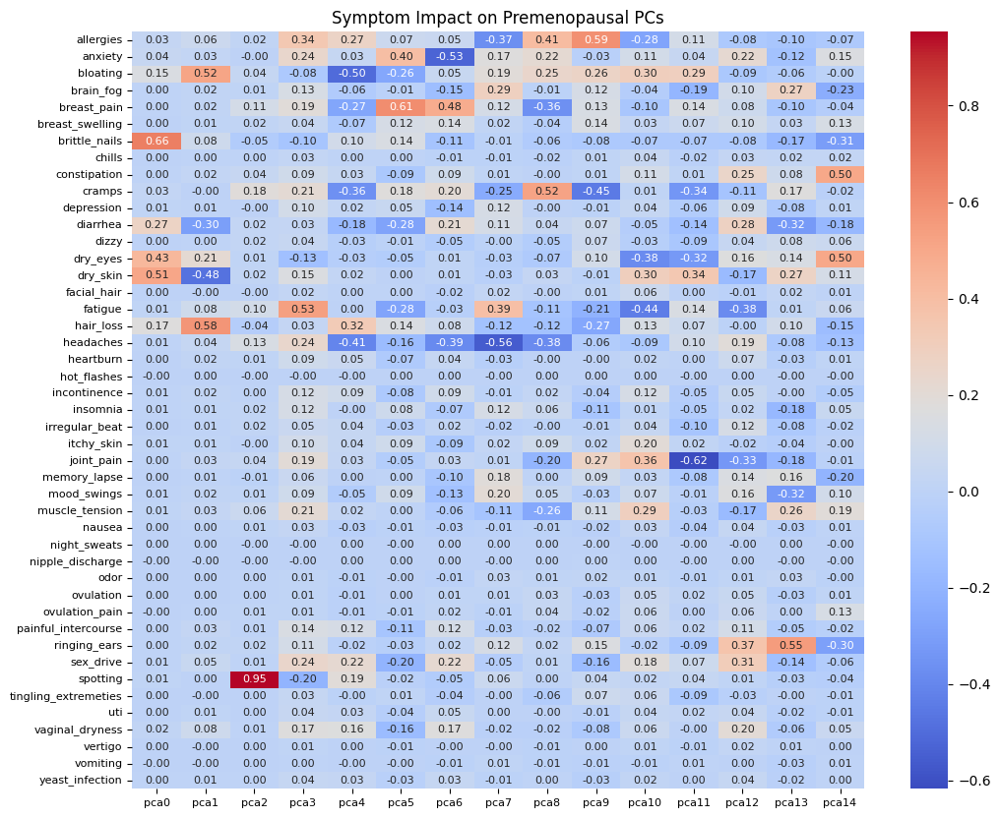

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

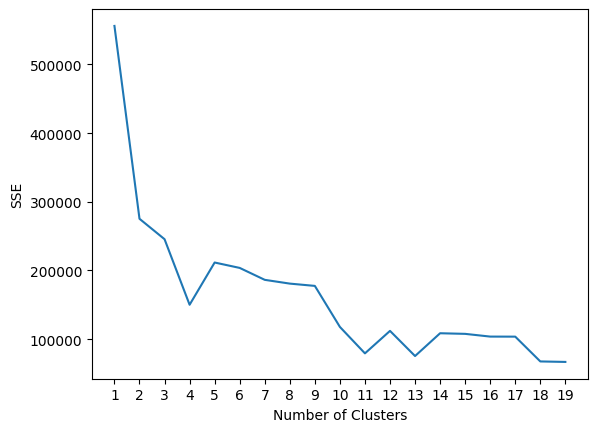

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

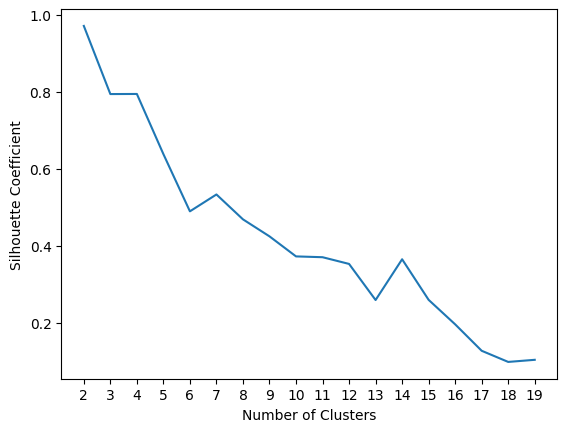

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Premenopausal Subset



In [1]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [2]:
from sensorfabric.athena import athena

In [3]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [4]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [5]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [6]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [7]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptompp_npt s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>10
        and symptoms_recorded<300
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(139829, 3)


In [10]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_npt_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [12]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptompp_npt s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
        and symptoms_recorded<300
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(40664, 3)


In [13]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,nausea,1


In [14]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3052


In [15]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [16]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [19]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [20]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1115


In [21]:
frame.to_csv('premenopausalsymptoms_npt_correct.csv')

In [22]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,nausea,dry_skin,vertigo,anxiety,bloating,chills,...,vaginal_dryness,itchy_skin,ovulation_pain,ovulation,odor,uti,nipple_discharge,yeast_infection,painful_intercourse,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9b22b7d01db71874617a55,1,9,5,0,3,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,5,0,...,2,1,0,0,0,0,0,0,0,0
5fec91a88c7e61fc62131b1c,0,0,0,0,0,1,0,4,0,0,...,0,0,0,0,0,0,0,0,0,0
6022a6fdbea29a1eb66b6fe0,1,0,0,0,0,0,1,4,0,0,...,0,0,0,0,0,0,0,0,0,0


In [23]:
frame.shape

(1115, 45)

In [24]:
data_type = frame[symptoms].dtypes

In [26]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('symptoms_premenopause_npt_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [27]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
27731


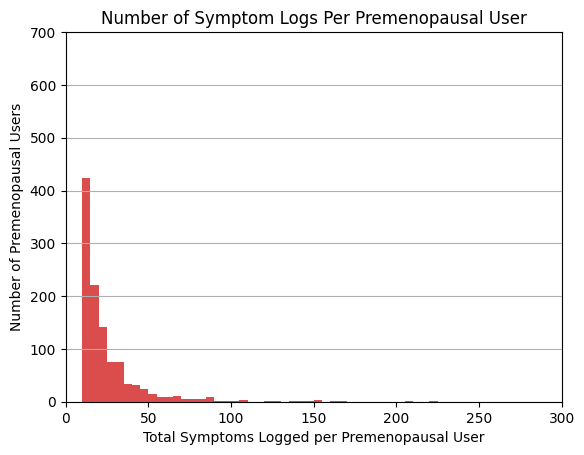

Median Symptoms per User: 17.0
Median Absolute Deviation (MAD) of Symptoms per User: 5.0


In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7,color=(205/255,0,0))
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,700) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [29]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.94%
spotting: 7.44%
cramps: 6.65%
bloating: 6.16%
headaches: 5.78%
anxiety: 5.02%
breast_pain: 4.23%
brain_fog: 3.79%
joint_pain: 3.60%
allergies: 3.34%
mood_swings: 3.10%
dry_skin: 3.02%
muscle_tension: 2.88%
depression: 2.66%
itchy_skin: 2.49%
insomnia: 2.23%
dry_eyes: 2.12%
constipation: 1.94%
ringing_ears: 1.85%
dizzy: 1.79%
hair_loss: 1.76%
facial_hair: 1.69%
brittle_nails: 1.67%
sex_drive: 1.67%
memory_lapse: 1.66%
breast_swelling: 1.51%
diarrhea: 1.28%
tingling_extremeties: 1.23%
nausea: 1.21%
incontinence: 1.12%
irregular_beat: 1.05%
heartburn: 0.91%
chills: 0.88%
odor: 0.86%
ovulation_pain: 0.75%
vaginal_dryness: 0.74%
vertigo: 0.58%
ovulation: 0.58%
uti: 0.23%
yeast_infection: 0.21%
painful_intercourse: 0.17%
vomiting: 0.12%
nipple_discharge: 0.08%
hot_flashes: 0.00%
night_sweats: 0.00%


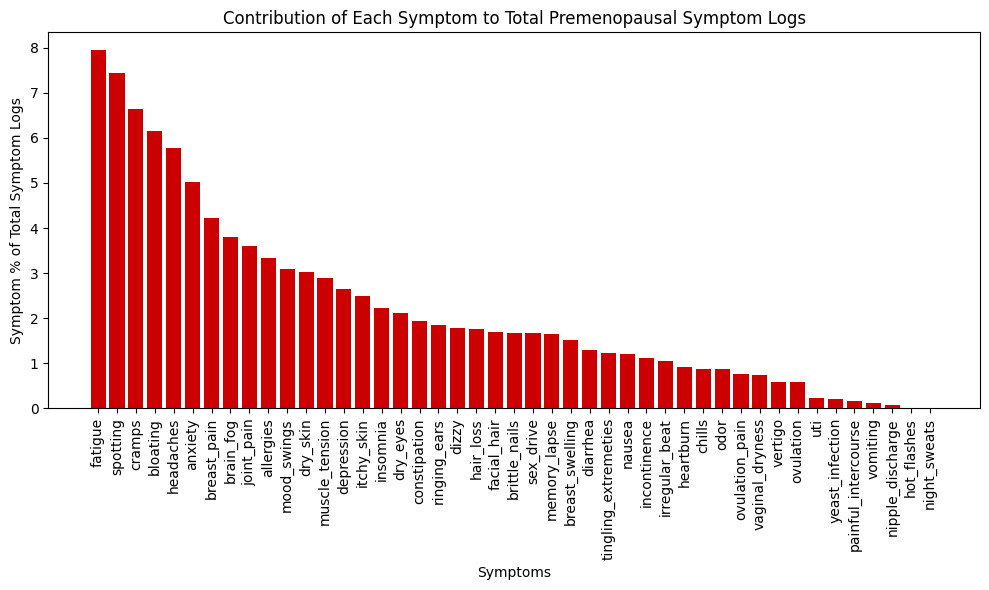

In [30]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values,color=(205/255,0,0))
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [31]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.439462
bloating                60.627803
cramps                  57.309417
headaches               52.645740
anxiety                 52.197309
brain_fog               47.443946
joint_pain              42.869955
mood_swings             40.538117
breast_pain             37.130045
dry_skin                36.681614
depression              36.322870
spotting                35.067265
muscle_tension          34.977578
allergies               34.080717
itchy_skin              32.286996
insomnia                29.417040
facial_hair             28.071749
dry_eyes                26.905830
dizzy                   26.278027
hair_loss               25.650224
constipation            24.394619
sex_drive               24.035874
brittle_nails           23.946188
memory_lapse            23.677130
tingling_extremeties    20.448430
ringing_ears            19.551570
diarrhea                19.551570
nausea                  18.834081
breast_swelling         17.219731
incontinence  

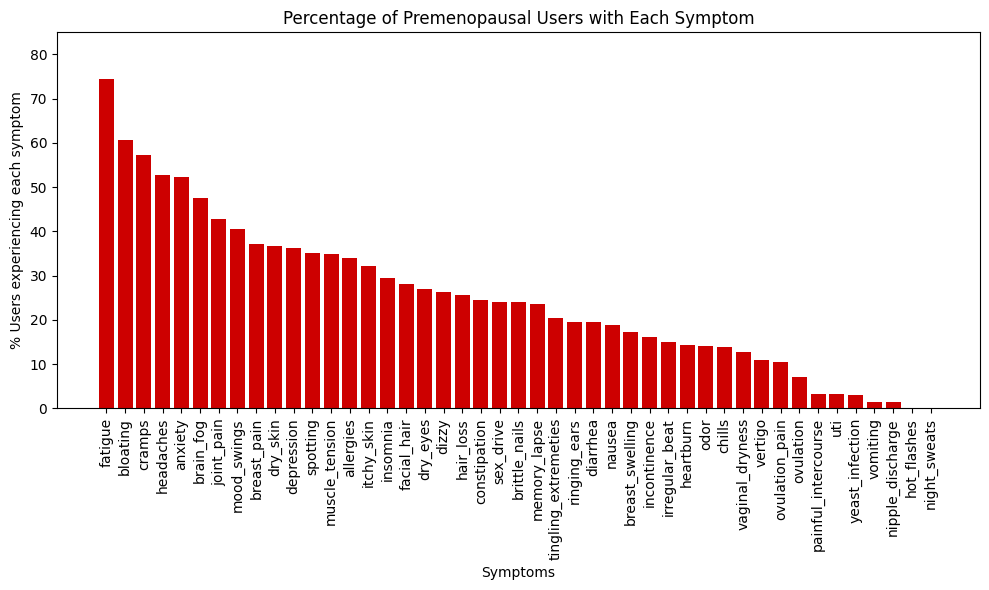

In [33]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values,color=(205/255,0,0))
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.ylim(0,85)
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [34]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


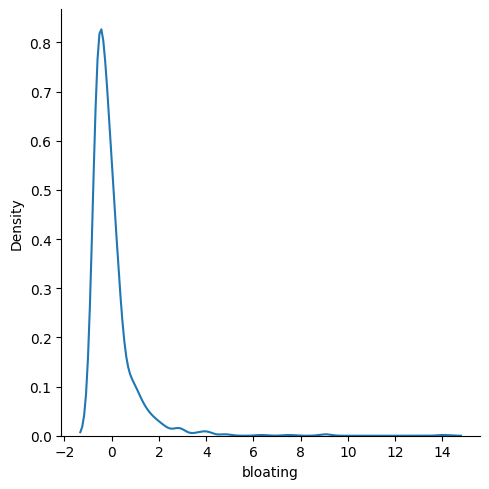

In [35]:
sns.displot(sframe, x='bloating', kind='kde')

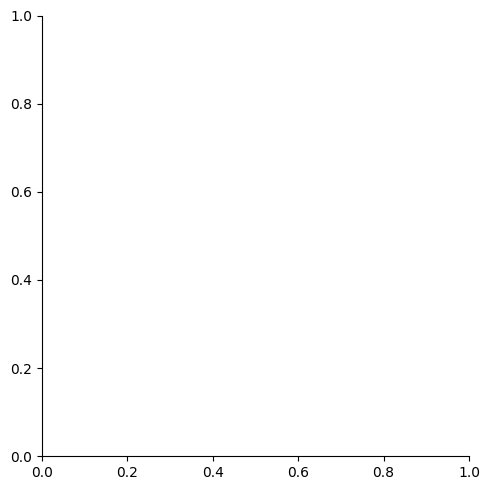

In [36]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [37]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [38]:
cmatrix.to_csv('premeno_npt_correct_symptom_covariance.csv', index=True)

In [40]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('premeno_npt_lenient_symptom_covariance.png')

## Find pairs of symptoms with more than 80% corelation.

In [42]:
import pandas as pd
import plotly.express as px

th = 0.4

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


          Symptom1        Symptom2  Covariance
3        brain_fog    memory_lapse    0.502118
7     memory_lapse       brain_fog    0.502118
0          anxiety        insomnia    0.480192
6         insomnia         anxiety    0.480192
10       ovulation             uti    0.425370
12             uti       ovulation    0.425370
1          anxiety     mood_swings    0.419005
8      mood_swings         anxiety    0.419005
2        brain_fog         fatigue    0.409794
5          fatigue       brain_fog    0.409794
9      mood_swings        vomiting    0.407808
13        vomiting     mood_swings    0.407808
4     constipation  ovulation_pain    0.407105
11  ovulation_pain    constipation    0.407105


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

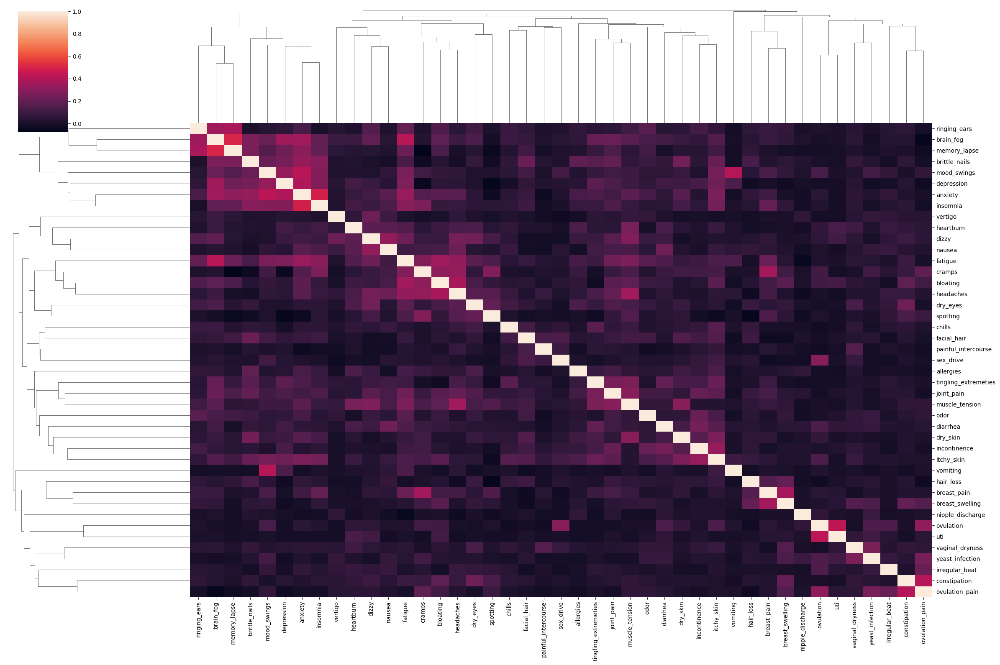

In [43]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [44]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [45]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 10


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [46]:
hcluster.savefig('premeno_npt_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [47]:
from sklearn.decomposition import PCA

In [48]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [49]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [50]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [51]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.34, 0.34
PCA2 - 0.13, 0.46
PCA3 - 0.06, 0.52
PCA4 - 0.06, 0.58
PCA5 - 0.04, 0.63
PCA6 - 0.04, 0.66
PCA7 - 0.03, 0.70
PCA8 - 0.03, 0.73
PCA9 - 0.03, 0.76
PCA10 - 0.02, 0.78
PCA11 - 0.02, 0.80
PCA12 - 0.02, 0.82
PCA13 - 0.02, 0.84
PCA14 - 0.01, 0.85
PCA15 - 0.01, 0.86


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [54]:
pcacomponents = pca.fit_transform(X)

In [55]:
pcacomponents.shape

(1115, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

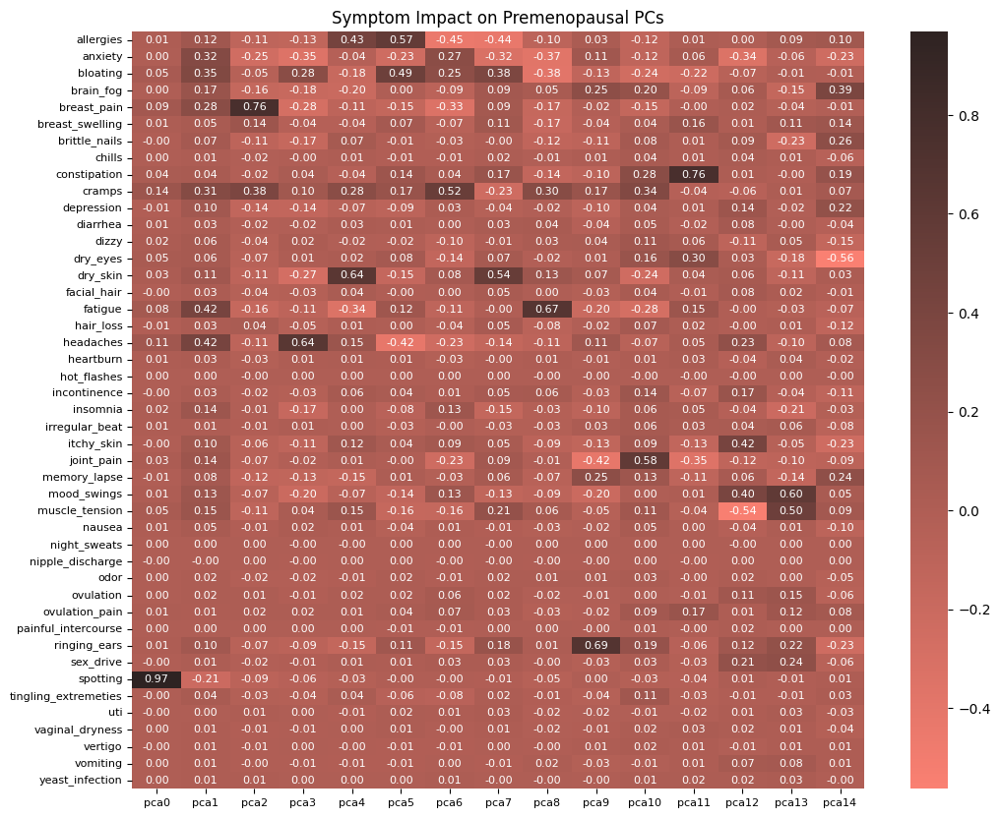

In [ ]:
#Alt plot that shows every row label
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Create a light palette with the color 'seagreen'
cmap=sns.color_palette("dark:salmon_r", as_cmap=True)

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using the custom colormap
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap=cmap, annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()


For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1115, 15)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

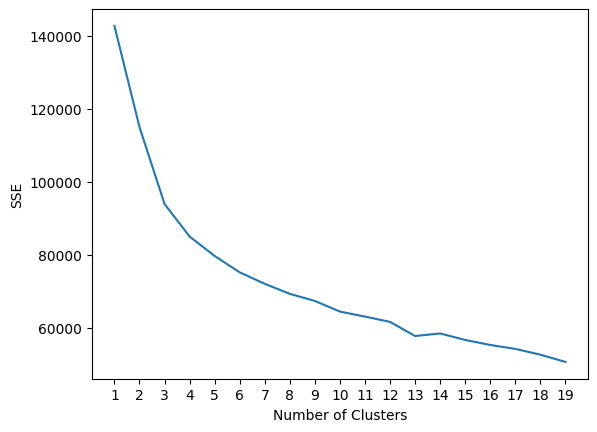

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

5

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

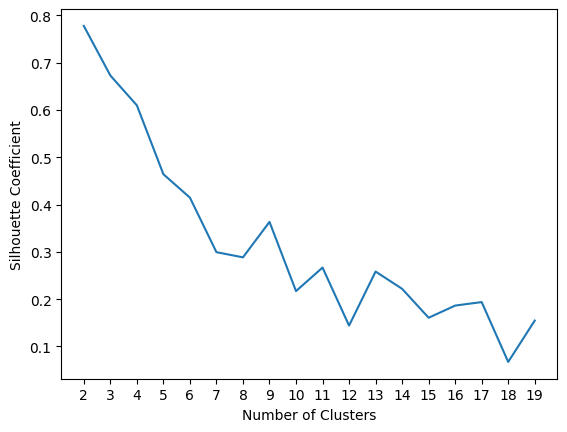

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

5

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 9
1 - 146
2 - 908
3 - 49
4 - 3


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=5):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=5):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['anxiety' 'bloating' 'fatigue' 'headaches' 'cramps']
Segment 1
['fatigue' 'cramps' 'headaches' 'bloating' 'breast_pain']
Segment 2
['fatigue' 'bloating' 'cramps' 'anxiety' 'headaches']
Segment 3
['spotting' 'cramps' 'breast_pain' 'headaches' 'fatigue']
Segment 4
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

## Alternatively if we use n=3 for segmentation

# Clustering Non Menopausal Subset



In [12]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [13]:
from sensorfabric.athena import athena

In [14]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [15]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [16]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [17]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [18]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>25
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


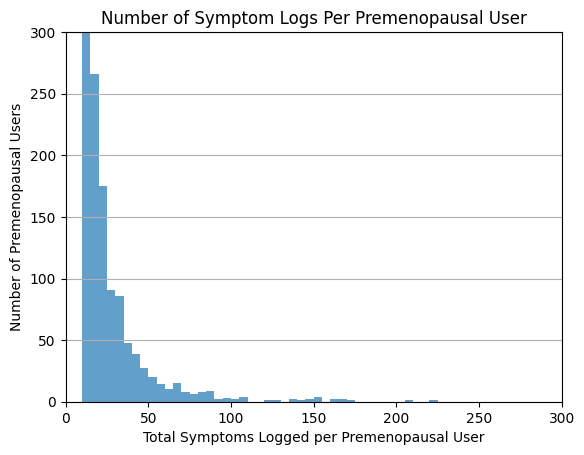

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


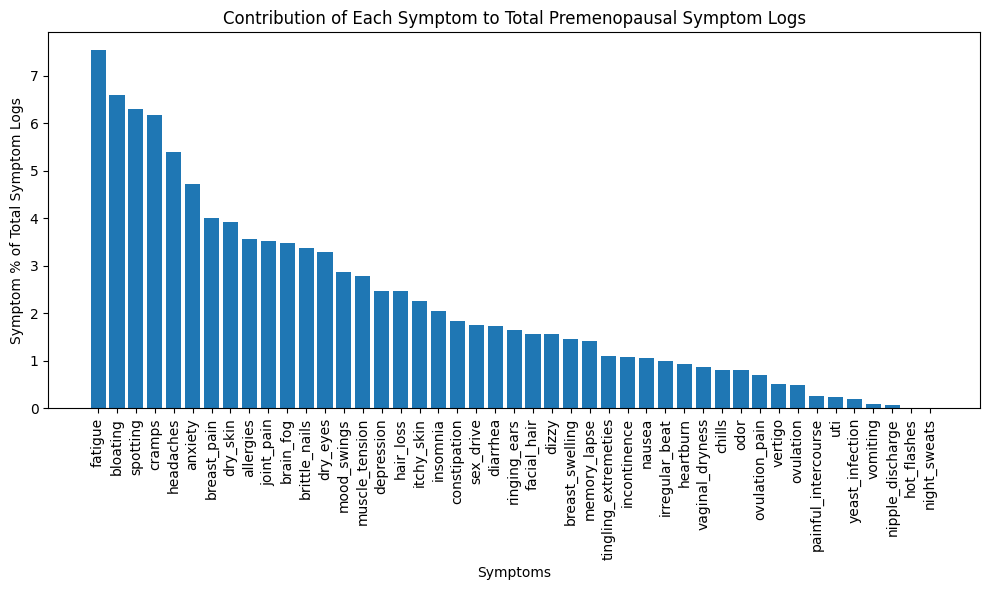

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

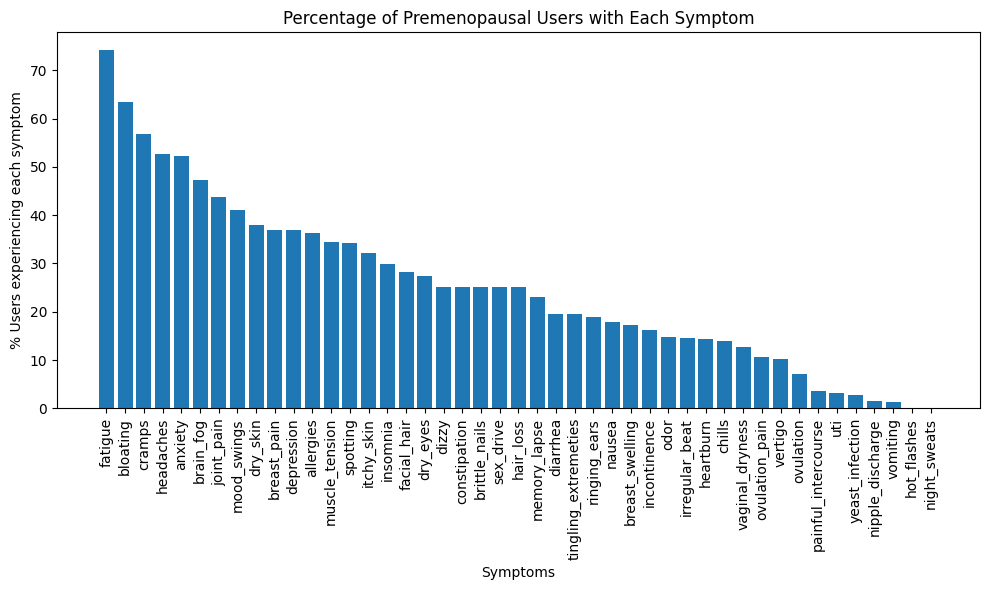

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



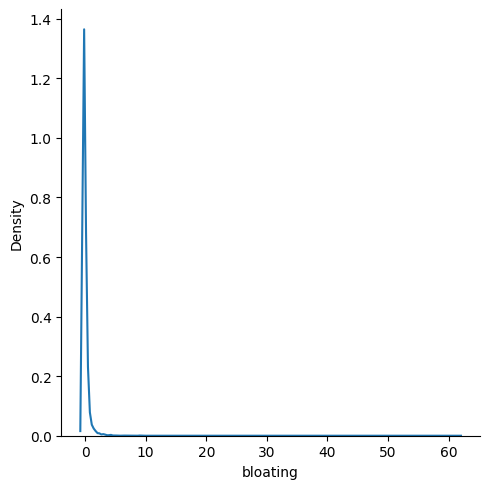

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

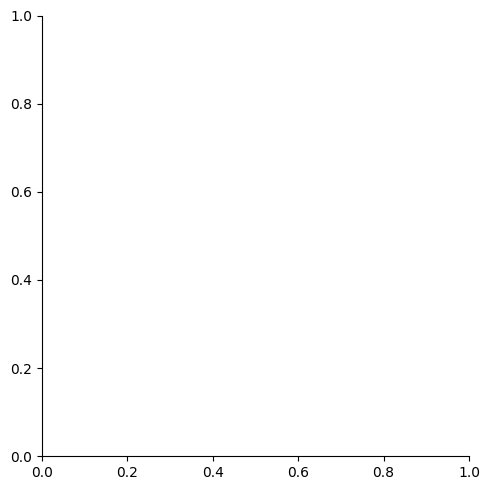

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

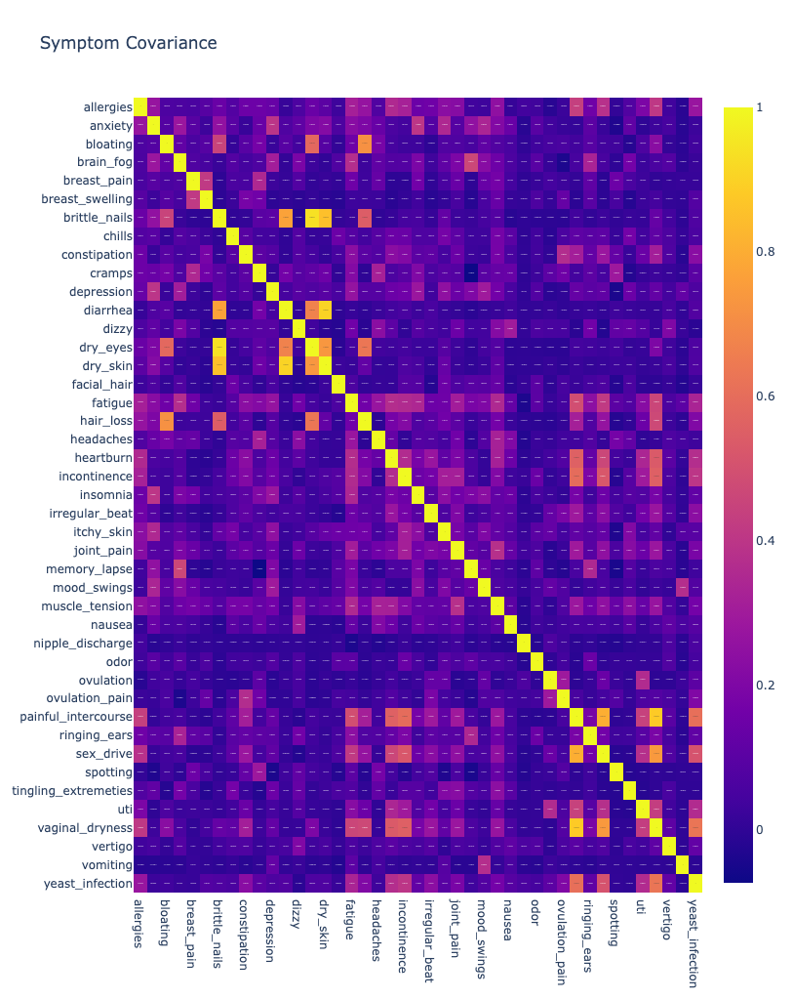

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

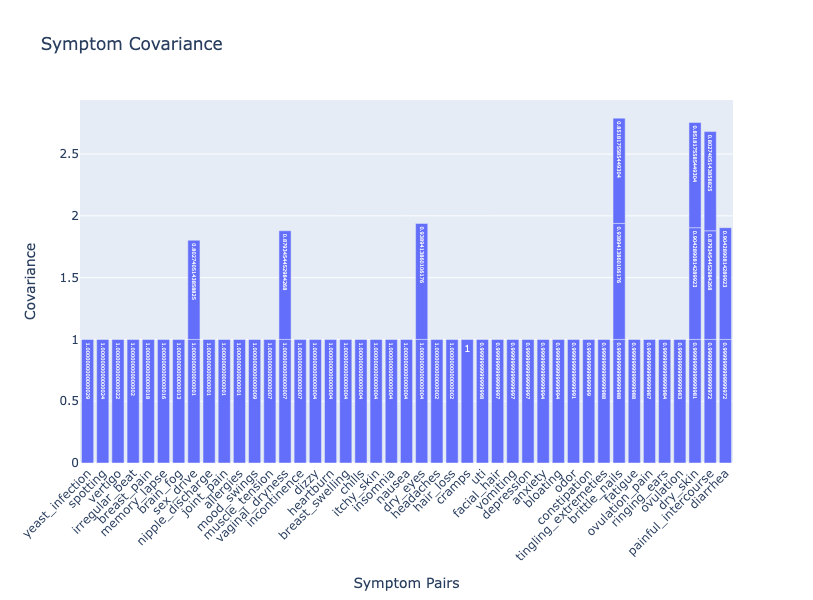

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

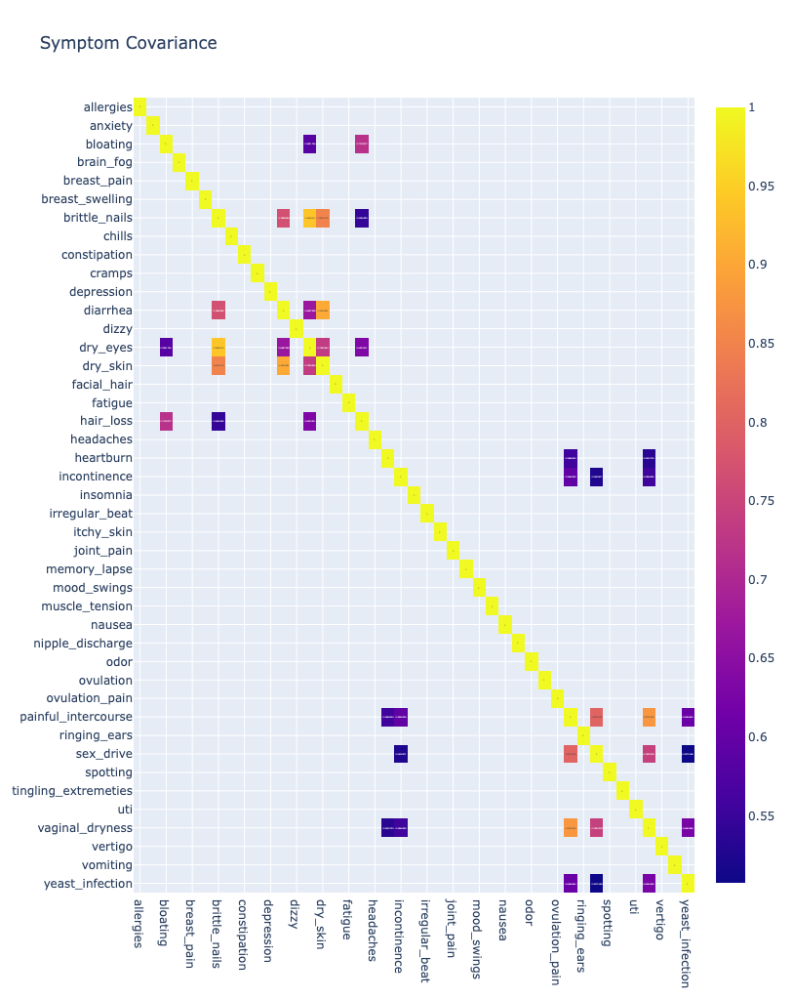

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


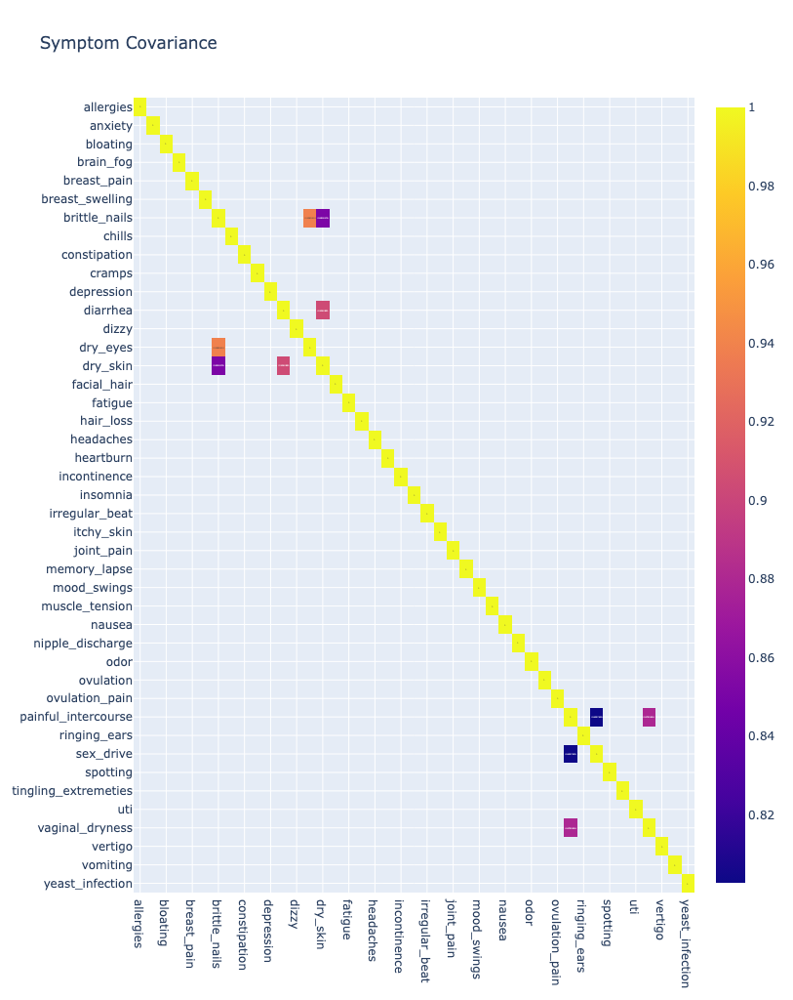

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

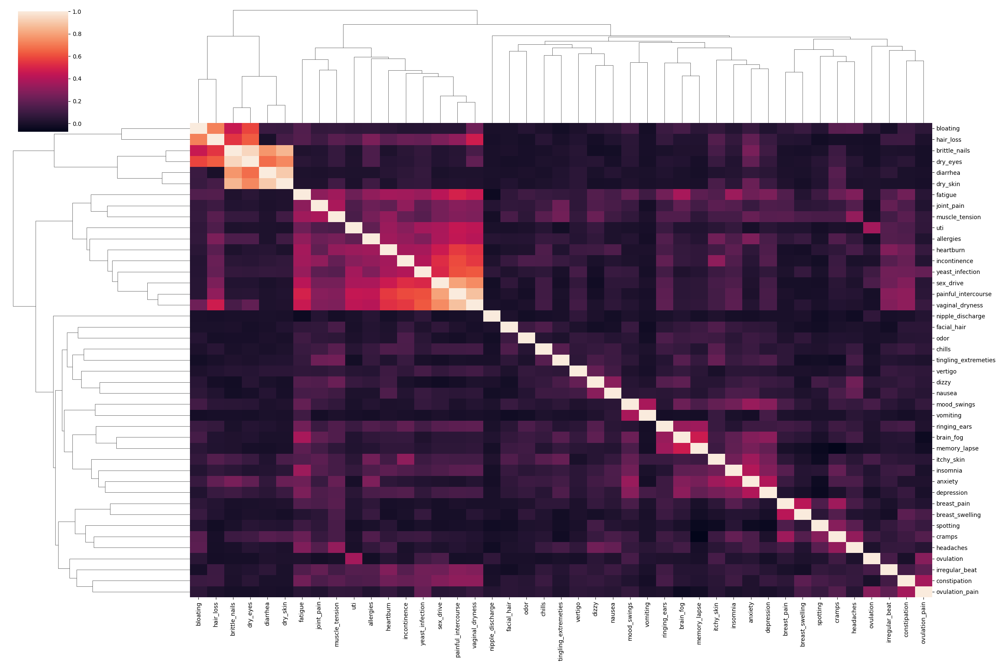

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

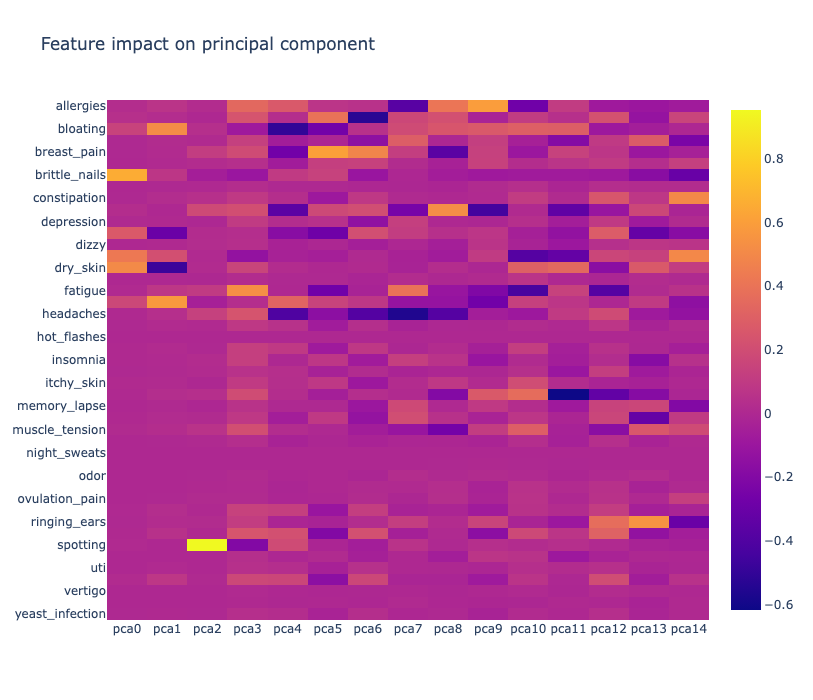

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

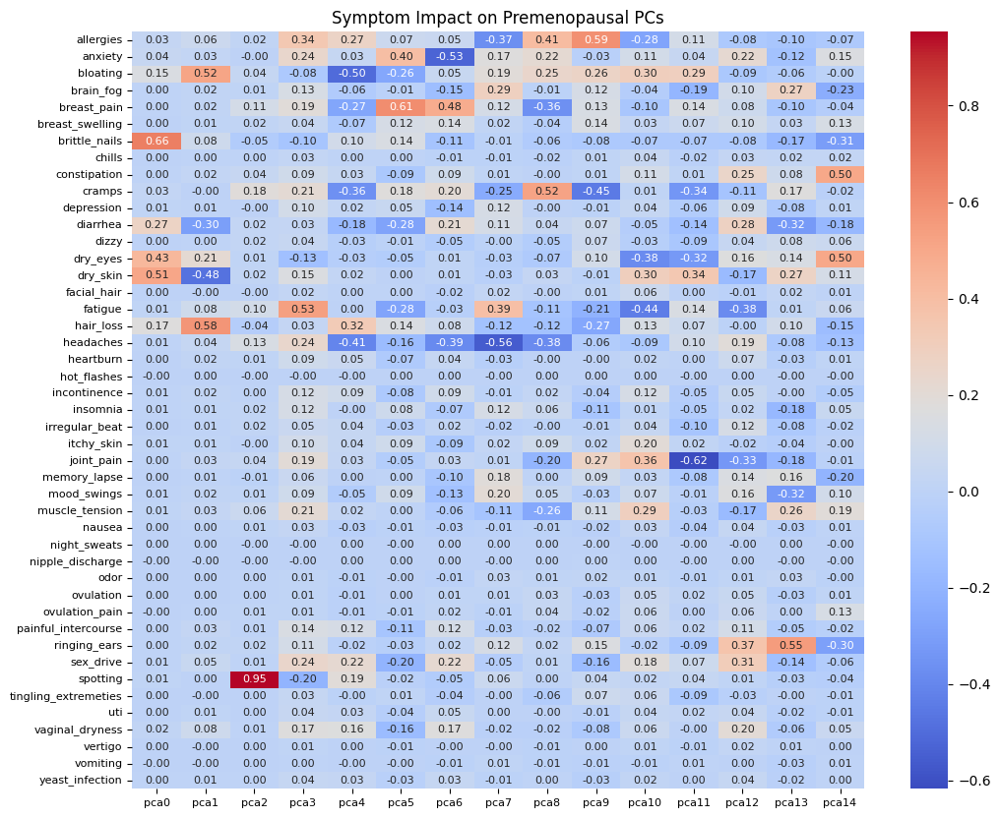

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

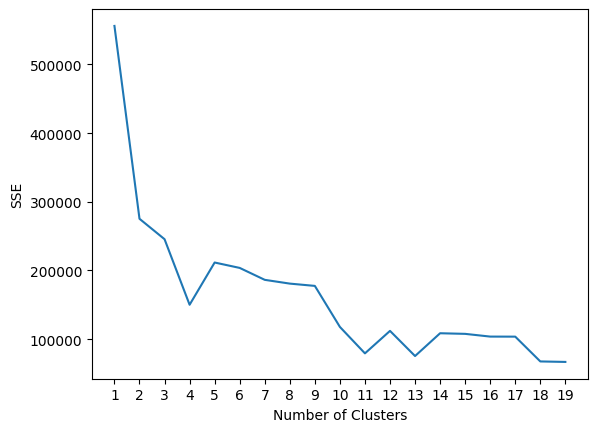

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

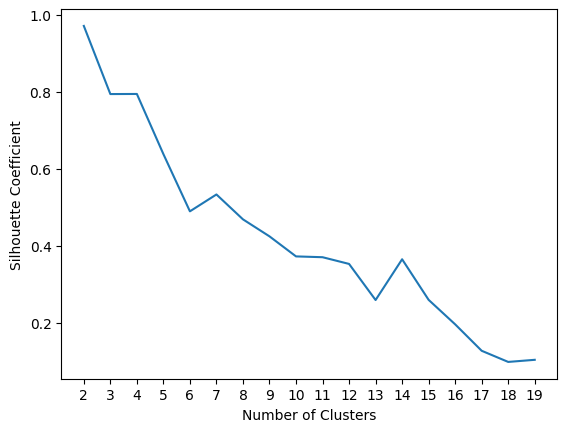

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Premenopausal Subset



In [3]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [4]:
from sensorfabric.athena import athena

In [5]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [6]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [7]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [8]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [9]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptomspp s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>10
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptomspp s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


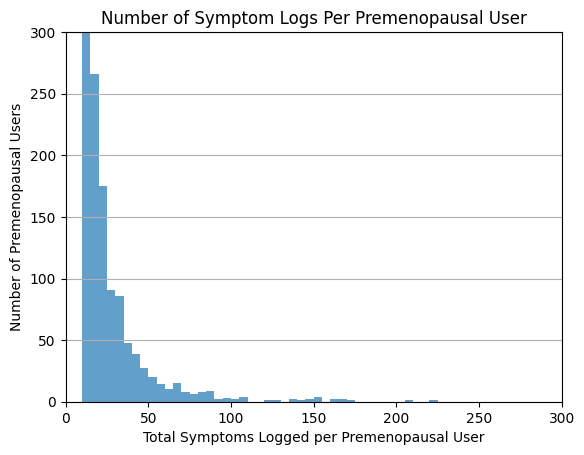

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


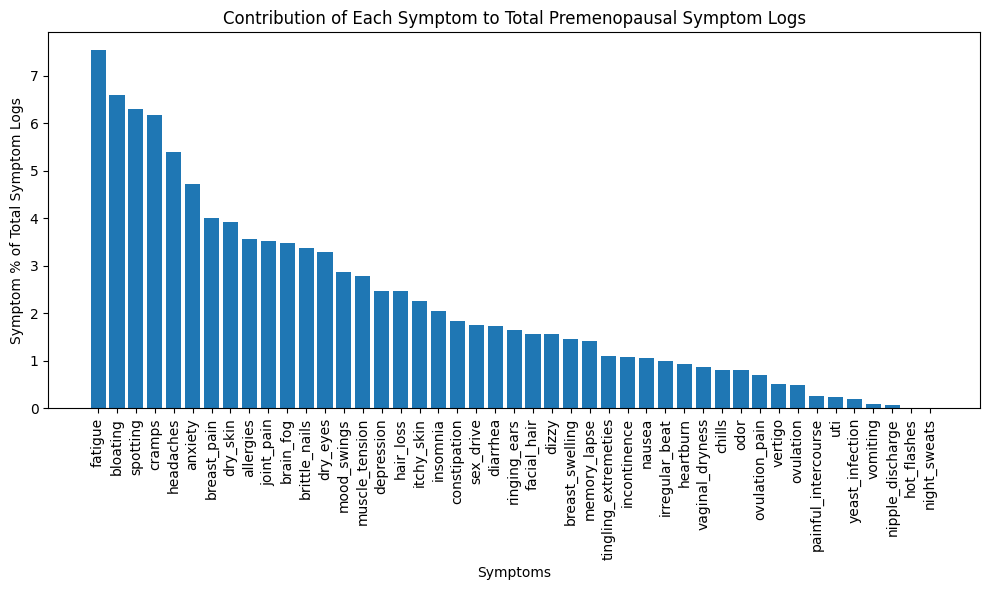

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

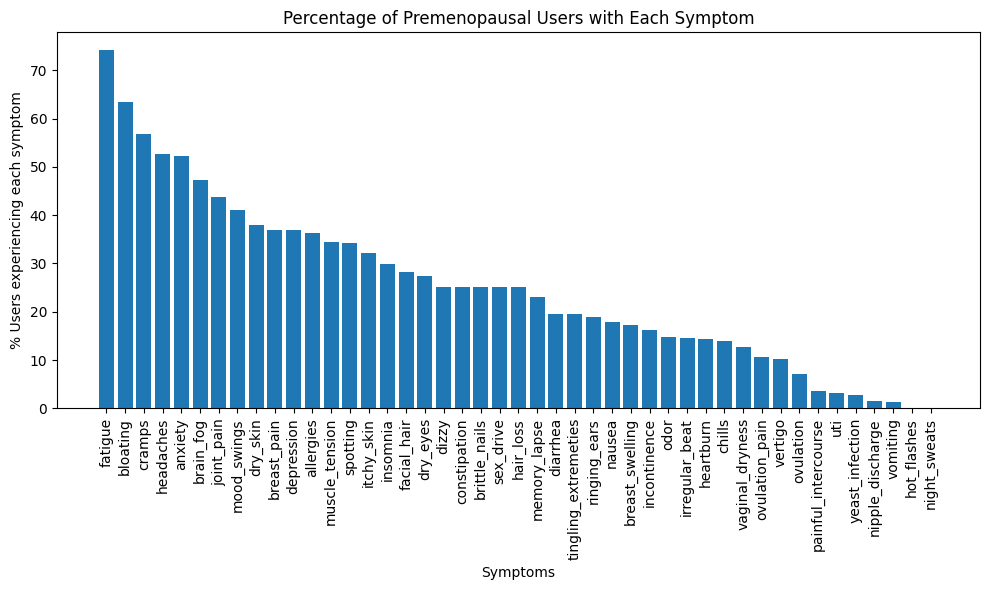

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



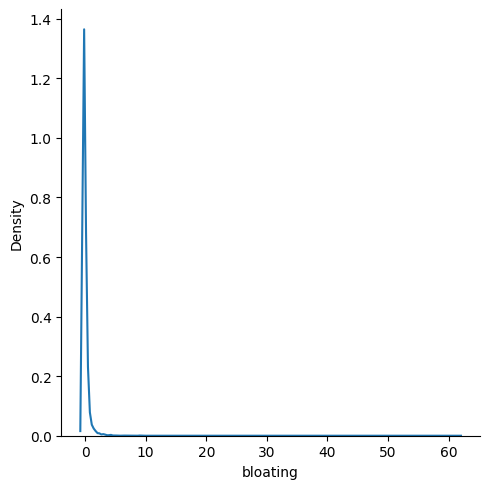

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

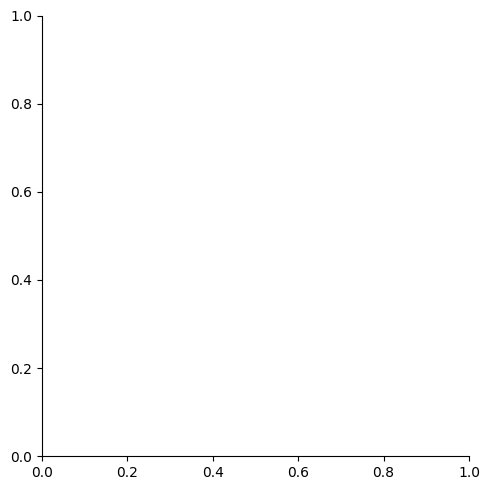

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

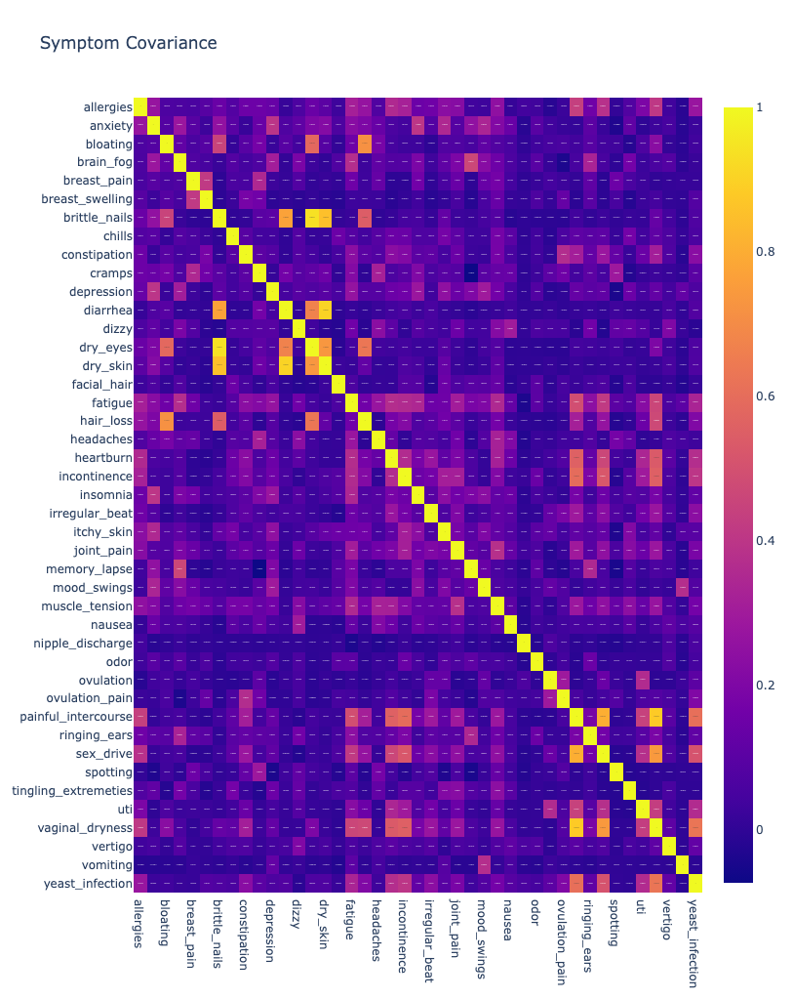

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

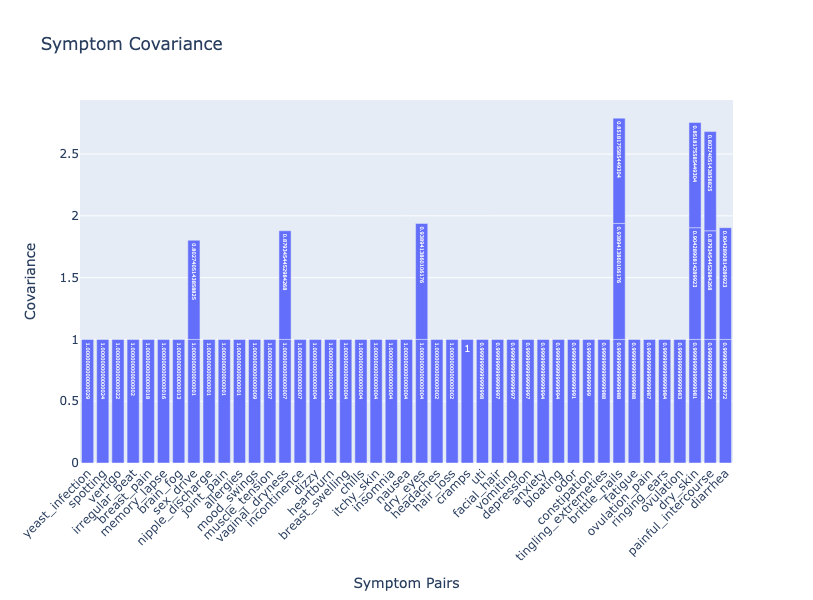

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

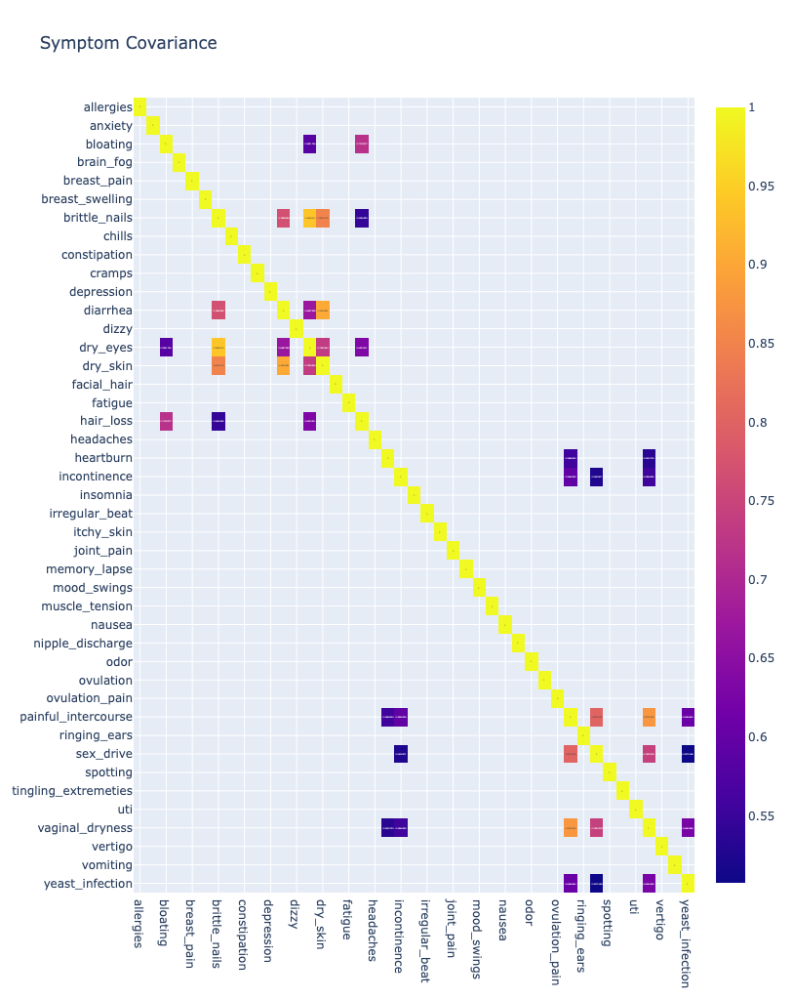

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


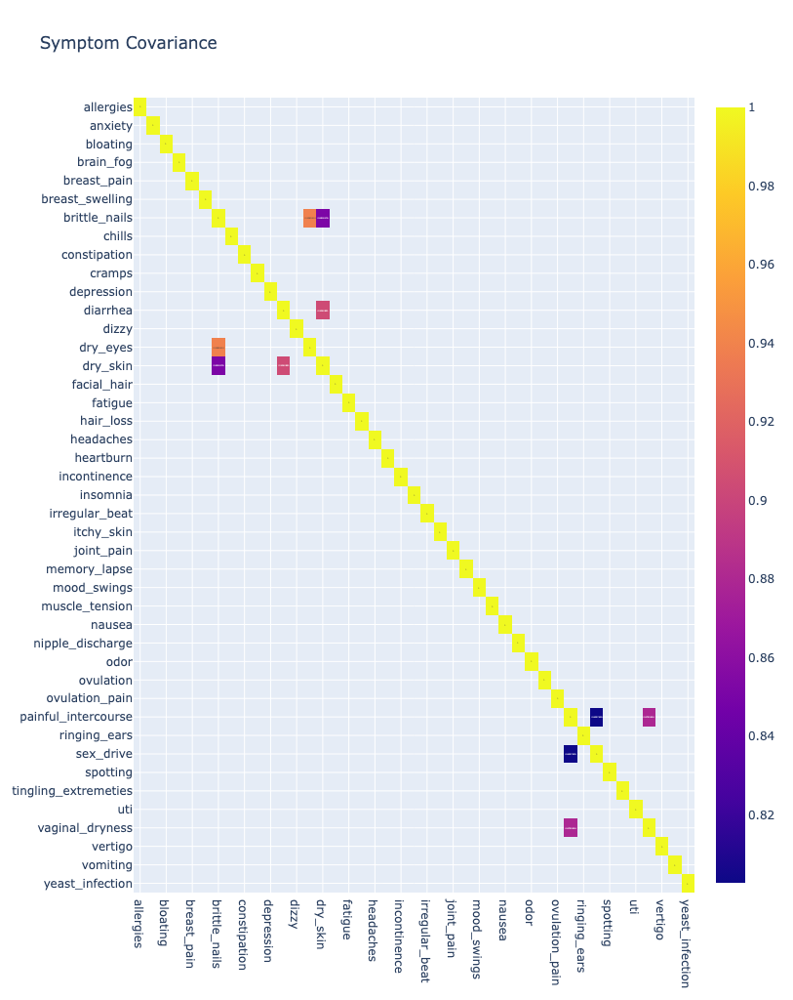

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

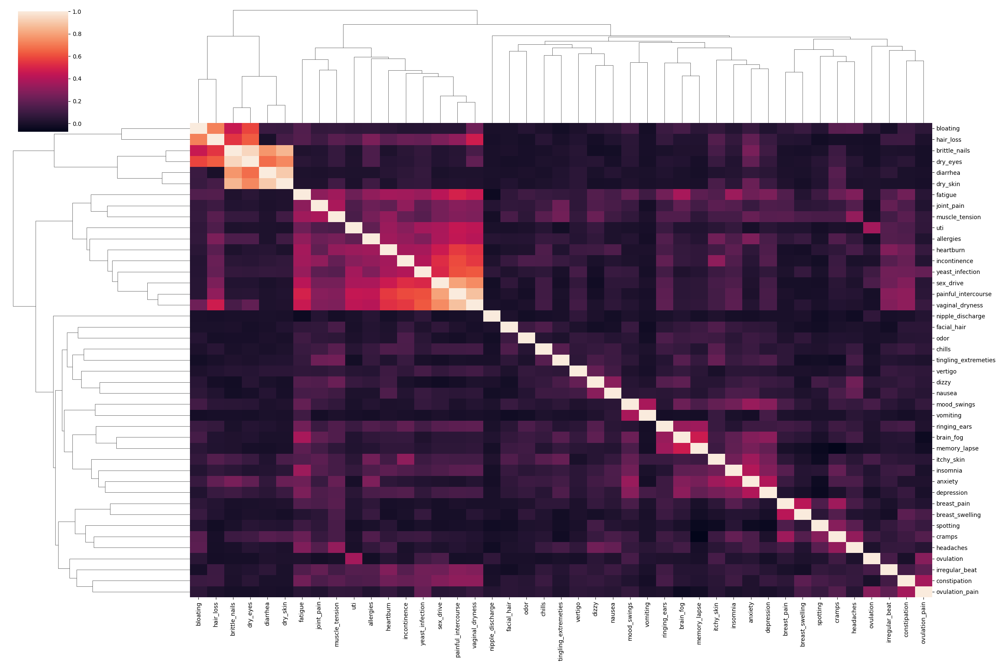

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

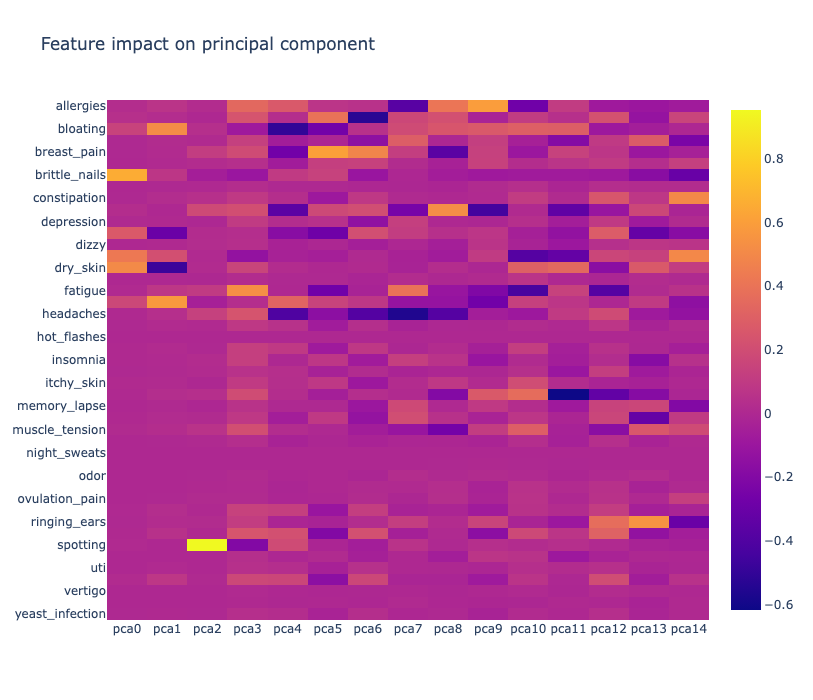

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

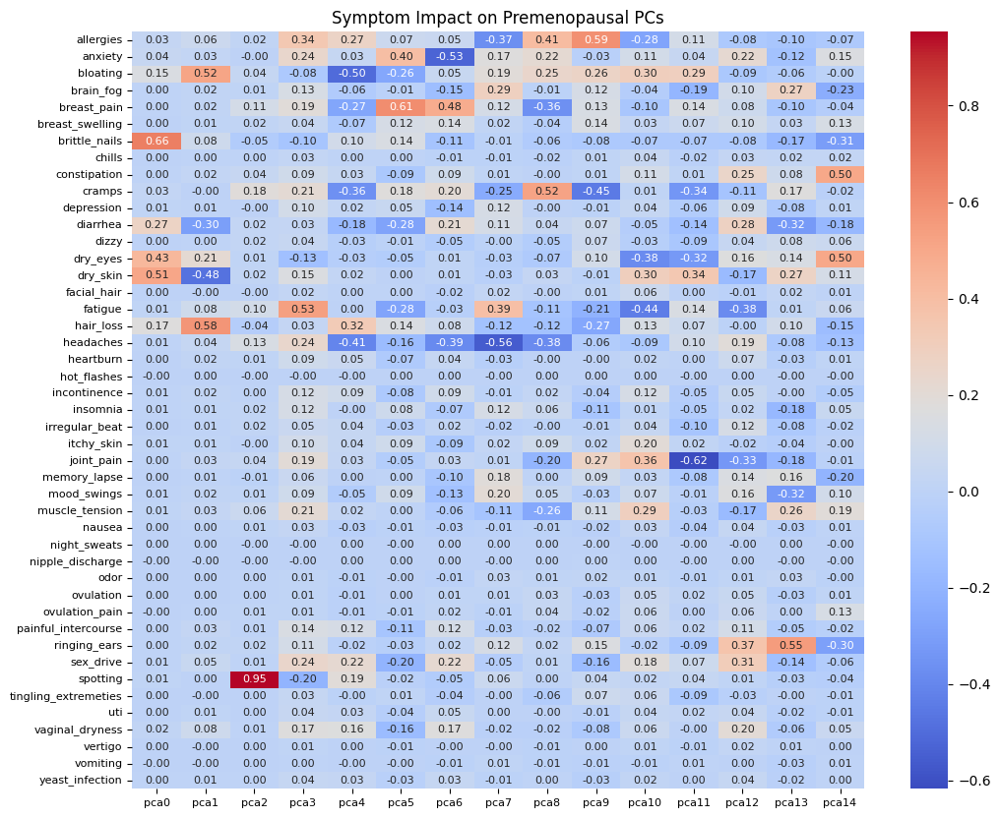

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

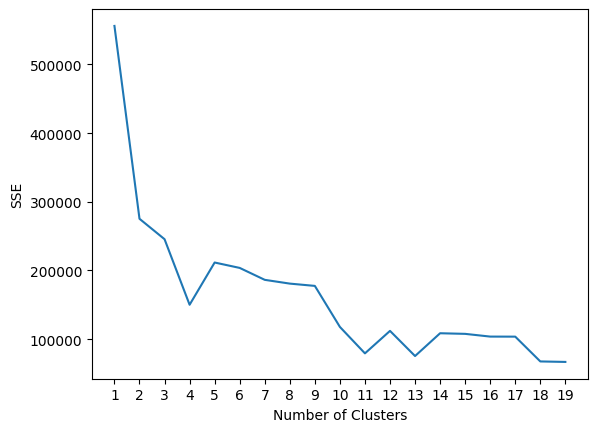

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

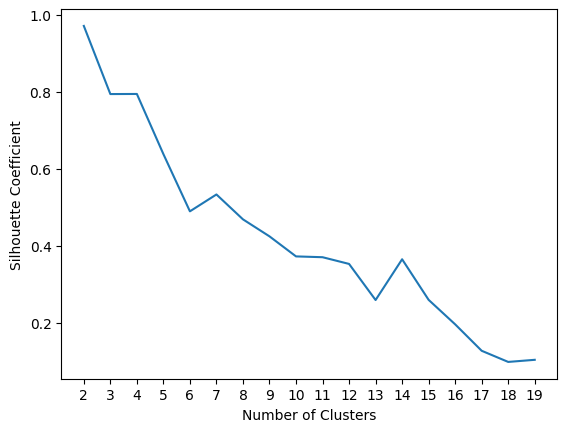

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 

# Clustering Non Menopausal Subset



In [12]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy as scipy
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score

In [13]:
from sensorfabric.athena import athena

In [14]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [15]:
%set_env AWS_PROFILE=opensci

env: AWS_PROFILE=opensci


In [16]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [17]:
# Get all the symptoms.
symptoms = db.execQuery("select distinct(name) name from symptoms order by name asc", cached=True)
print(symptoms.shape)

(45, 1)


In [18]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

## Comprehensive Premenopausal Query (Not selective enough!!)

In [ ]:
premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp 
    WHERE (questions = 'Let''s customize your personal health tracker!'
        OR questions = 'Choose the symptoms you deal with the most.'
        AND questions = 'How would you describe your periods?'
        AND questions = 'Are you on birth control?'
        AND questions = 'How did you enter menopause?')
        AND length(answers) > 0
        AND (
            (
            answers NOT LIKE '%Hot Flashes/Night Sweats%'
            AND answers NOT LIKE '%have a period anymore%'
            AND answers NOT LIKE '%IUD%'
            AND answers NOT LIKE '%Pill%'
            AND answers NOT LIKE '%Implant%'
            AND answers NOT LIKE '%Shot%'
            AND answers NOT LIKE '%Vaginal Ring%'
            AND answers NOT LIKE '%Patch%'
            AND answers NOT LIKE '%Naturally%'
            AND answers NOT LIKE '%Medically%'
            AND answers NOT LIKE '%Hysterectomy%'
            AND answers NOT LIKE '%Chemotherapy%'
            )
            OR answers = 'Unpredictable'
            OR answers = 'Regular cycle'
            OR answers = 'none'
        )
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(8414, 3)


## Checking the actual onboarding responses to a simpler version of the query

In [9]:


premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded>25
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, o.questions, o.answers
FROM query2 q2
INNER JOIN onboardingpp o ON q2.uid = o.healthid
ORDER BY q2.uid, o.questions, q2.count DESC;

   

"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)



(95912, 3)


In [ ]:
premenopausalusers_symptoms.to_csv('onboarding_premenopausal_check.csv')

## Ultrasimple Premenopause Query - Seems to filter out all menopausal answers. Still includes people with hot flashes which I will filter out later. This should be the "truest" premenopausal set


In [11]:

premenopausalusers_symptoms_query = """

WITH query1 AS (

    SELECT DISTINCT healthid
    FROM onboardingpp o
    WHERE (questions = 'How would you describe your periods?')
        AND length(answers) > 0
        AND answers NOT LIKE '%have a period anymore%'
        AND answers NOT LIKE '%take birth control%'
),

query2 AS (
    SELECT s.uid, s.name, COUNT(s.name) AS count 
    FROM symptoms s
    INNER JOIN query1 q1 ON s.uid = q1.healthid
    INNER JOIN (
        SELECT uid
        FROM symptoms_sum ss
        WHERE days_symptoms_recorded > 0
        and symptoms_recorded >10
       
        AND ss.uid IN (SELECT DISTINCT healthid FROM query1)
    ) ss ON q1.healthid = ss.uid
    GROUP BY s.uid, s.name
)

SELECT q2.uid, q2.name, q2.count
FROM query2 q2
ORDER BY q2.uid, q2.count DESC;
"""

premenopausalusers_symptoms = db.execQuery(premenopausalusers_symptoms_query, cached=True)
print(premenopausalusers_symptoms.shape)

(51642, 3)


In [ ]:
premenopausalusers_symptoms.head()

,uid,name,count
0,5f98bab244eca8ead4eca209,dry_eyes,4
1,5f98bab244eca8ead4eca209,spotting,3
2,5f98bab244eca8ead4eca209,brain_fog,2
3,5f98bab244eca8ead4eca209,memory_lapse,1
4,5f98bab244eca8ead4eca209,breast_pain,1


In [ ]:
#Is this still keeping only the correct uids? 

# Calculate the unique number of UIDs
unique_uids_count = len(premenopausalusers_symptoms['uid'].unique())

# Display the unique number of UIDs
print("Unique number of UIDs:", unique_uids_count)

Unique number of UIDs: 3776


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(premenopausalusers_symptoms['uid'].values, premenopausalusers_symptoms['name'].values, premenopausalusers_symptoms['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)


In [ ]:
frame=frame.astype(int)

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_withhf_premenopause_onehot.csv', index=False)

## Diving a bit deeper into who is reporting hot flashes or night sweats in this group. (shravan pet project)

?Shravan - How many people who we classified as pre-menopausal also report classic memopause symptoms like hot-flashes and night sweats.

In [ ]:
special = frame[(frame['hot_flashes'] > 0) | (frame['night_sweats'] > 0)]

In [ ]:
print(special.shape)
print(frame.shape)
print(special.shape[0]/frame.shape[0])

(2437, 45)
(3775, 45)
0.6455629139072848


~64% of the user who have been classified in the pre-menopause group report having hot flashes or night sweats.

There are 2,437 users 

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = special.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

hot_flashes: 12.12%
fatigue: 6.44%
headaches: 4.97%
bloating: 4.39%
cramps: 4.35%
anxiety: 4.16%
joint_pain: 4.04%
night_sweats: 3.86%
allergies: 3.81%
dry_skin: 3.41%
muscle_tension: 2.88%
insomnia: 2.83%
brain_fog: 2.77%
dry_eyes: 2.65%
mood_swings: 2.51%
breast_pain: 2.45%
spotting: 2.44%
brittle_nails: 2.43%
depression: 2.20%
itchy_skin: 2.11%
ringing_ears: 1.78%
chills: 1.65%
dizzy: 1.58%
sex_drive: 1.42%
nausea: 1.41%
constipation: 1.35%
facial_hair: 1.34%
diarrhea: 1.34%
tingling_extremeties: 1.34%
incontinence: 1.18%
hair_loss: 1.12%
irregular_beat: 1.11%
heartburn: 1.03%
memory_lapse: 1.03%
breast_swelling: 0.98%
odor: 0.98%
vaginal_dryness: 0.72%
ovulation_pain: 0.49%
vertigo: 0.38%
ovulation: 0.22%
vomiting: 0.20%
yeast_infection: 0.18%
painful_intercourse: 0.16%
uti: 0.14%
nipple_discharge: 0.06%


## Get the symptom breakdown by the (period = unpredictable, period = regular)

### Unpredictable

In [ ]:
import utils

unpredictable_uids = db.execQuery('select uid from premeno_period_unpredictable', cached=True)

In [ ]:
unpredictable = frame[frame.index.isin(unpredictable_uids['uid'].values)]

In [ ]:
utils.symPercentages(unpredictable)

hot_flashes: 12.02%
fatigue: 6.62%
headaches: 4.85%
cramps: 4.32%
anxiety: 4.32%
bloating: 4.30%
joint_pain: 3.99%
allergies: 3.73%
dry_skin: 3.55%
night_sweats: 3.30%
spotting: 3.18%
muscle_tension: 2.86%
insomnia: 2.77%
brittle_nails: 2.72%
brain_fog: 2.72%
mood_swings: 2.59%
dry_eyes: 2.54%
breast_pain: 2.43%
depression: 2.34%
itchy_skin: 2.19%
chills: 1.61%
ringing_ears: 1.58%
dizzy: 1.53%
sex_drive: 1.38%
facial_hair: 1.36%
diarrhea: 1.36%
constipation: 1.35%
hair_loss: 1.34%
nausea: 1.30%
tingling_extremeties: 1.29%
memory_lapse: 1.13%
incontinence: 1.12%
heartburn: 1.02%
irregular_beat: 0.96%
odor: 0.85%
breast_swelling: 0.84%
vaginal_dryness: 0.72%
ovulation_pain: 0.51%
vertigo: 0.39%
ovulation: 0.21%
vomiting: 0.18%
painful_intercourse: 0.17%
yeast_infection: 0.17%
uti: 0.17%
nipple_discharge: 0.07%


### Regular

In [ ]:
regular_uids = db.execQuery('select uid from premeno_period_regular', cached=True)
regular = frame[frame.index.isin(regular_uids['uid'].values)]
utils.symPercentages(regular)

fatigue: 6.71%
bloating: 6.10%
cramps: 5.65%
headaches: 5.55%
hot_flashes: 4.23%
anxiety: 4.13%
allergies: 3.83%
joint_pain: 3.83%
breast_pain: 3.54%
dry_skin: 3.38%
dry_eyes: 3.36%
brain_fog: 3.36%
spotting: 3.16%
muscle_tension: 2.84%
night_sweats: 2.69%
mood_swings: 2.56%
insomnia: 2.45%
brittle_nails: 2.32%
ringing_ears: 2.20%
depression: 2.02%
itchy_skin: 1.99%
sex_drive: 1.76%
constipation: 1.68%
dizzy: 1.67%
breast_swelling: 1.67%
diarrhea: 1.56%
hair_loss: 1.47%
nausea: 1.44%
facial_hair: 1.44%
irregular_beat: 1.39%
tingling_extremeties: 1.29%
incontinence: 1.27%
chills: 1.19%
odor: 1.18%
memory_lapse: 1.03%
heartburn: 0.99%
vaginal_dryness: 0.81%
ovulation_pain: 0.60%
vertigo: 0.46%
ovulation: 0.45%
yeast_infection: 0.22%
painful_intercourse: 0.19%
vomiting: 0.17%
uti: 0.13%
nipple_discharge: 0.05%


## Back to removing the folks who had HF and NS

In [ ]:
#Note some users are still reporting hot flashes. Remove them. 

frame = frame[(frame['hot_flashes'] == 0) & (frame['night_sweats'] == 0)]

In [ ]:
#Now how many do I have left?

unique_uids = frame.index.unique().tolist()
unique_uids_size = len(unique_uids)
print("Size of unique_uids:", unique_uids_size)

Size of unique_uids: 1338


In [ ]:
frame.to_csv('premenopausalsymptoms_correct.csv')

In [ ]:
frame.head()

,dry_eyes,spotting,brain_fog,memory_lapse,breast_pain,dry_skin,vertigo,anxiety,fatigue,chills,...,heartburn,uti,yeast_infection,cramps,itchy_skin,ovulation_pain,dizzy,ovulation,nipple_discharge,vomiting
uid,,,,,,,,,,,,,,,,,,,,,
5f98bab244eca8ead4eca209,4,3,2,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
5f9990d744eca8ead4eca2d5,0,0,3,1,0,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
5f9aebc8b82e4d12e4a90e68,12,1,4,3,1,8,2,3,61,3,...,19,12,10,6,6,2,0,0,0,0
5f9b22b7d01db71874617a55,1,10,5,0,11,0,0,0,3,0,...,0,0,0,13,0,0,3,0,0,0
5f9b505bd01db71874617af4,6,0,1,0,0,1,0,5,0,0,...,2,0,0,3,1,0,5,0,0,0


In [ ]:
frame.shape

(1338, 45)

In [ ]:
data_type = frame[symptoms].dtypes

In [ ]:
encoding = frame.copy(deep=True)
def replace_map(x):
    if x > 0:
        return 1
    else:
        return 0
encoding = encoding.applymap(replace_map)

encoding.to_csv('csv/symptoms_premenopause_onehot.csv', index=False)

## What's the distribution of symptoms by UID, and total Number of symptoms?

In [ ]:
total_symptom_count_per_uid = frame.sum(axis=1)

# Overall sum of all symptom counts
overall_total_symptom_count = total_symptom_count_per_uid.sum()

#print("Total symptom count per UID:")
#print(total_symptom_count_per_uid)

print("\nOverall total symptom count:")
print(overall_total_symptom_count)


Overall total symptom count:
36712


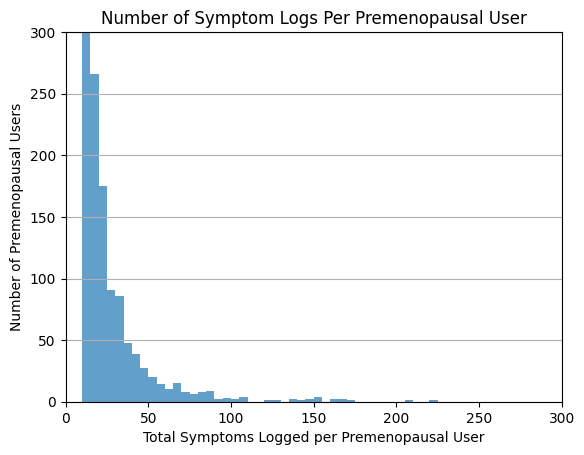

Median Symptoms per User: 18.0
Median Absolute Deviation (MAD) of Symptoms per User: 6.0


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming you already have the 'frame' dataframe with symptom counts

# Total symptom count for each UID
total_symptom_count_per_uid = frame.sum(axis=1)

# Calculate the total symptoms per user
total_symptoms_per_user = total_symptom_count_per_uid.values

# Calculate the median and median absolute deviation
median_symptoms_per_user = np.median(total_symptoms_per_user)
mad_symptoms_per_user = np.median(np.abs(total_symptoms_per_user - median_symptoms_per_user))


# Create histogram with specified bins
bins = range(0, max(total_symptoms_per_user) + 5, 5)

plt.hist(total_symptoms_per_user, bins=bins, edgecolor='none', alpha=0.7)
plt.xlabel('Total Symptoms Logged per Premenopausal User')
plt.ylabel('Number of Premenopausal Users')
plt.title('Number of Symptom Logs Per Premenopausal User')
plt.grid(axis='y')
plt.ylim(0,300) #note it goes up to about 2500
plt.xlim(0, 300) #note some rando users log >500 symptoms. Should we omit them?
plt.show()

print("Median Symptoms per User:", median_symptoms_per_user)
print("Median Absolute Deviation (MAD) of Symptoms per User:", mad_symptoms_per_user)


## Symptom Frequency by % of Total Symptoms, For Each Symptom

In [ ]:
# Calculate the total count of each symptom type (sum across columns)
symptom_totals = frame.sum(axis=0)

# Calculate the total count of all symptoms
total_symptom_count = symptom_totals.sum()

# Calculate the percentage of each symptom type's count relative to the total count of all symptoms
symptom_percentages = (symptom_totals / total_symptom_count) * 100

# Sort the symptom_percentages in descending order (most frequent to least frequent)
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

# Print out each symptom type and its corresponding percentage in the sorted order
c = 0
for symptom, count in zip(symptom_percentages_sorted.index, symptom_percentages_sorted.values):
    c += 1
    print(f"{symptom}: {count:.2f}%")
    if c > 100:
        break

fatigue: 7.54%
bloating: 6.59%
spotting: 6.31%
cramps: 6.18%
headaches: 5.39%
anxiety: 4.73%
breast_pain: 4.00%
dry_skin: 3.92%
allergies: 3.57%
joint_pain: 3.53%
brain_fog: 3.48%
brittle_nails: 3.38%
dry_eyes: 3.29%
mood_swings: 2.88%
muscle_tension: 2.78%
depression: 2.47%
hair_loss: 2.46%
itchy_skin: 2.26%
insomnia: 2.05%
constipation: 1.83%
sex_drive: 1.76%
diarrhea: 1.74%
ringing_ears: 1.65%
facial_hair: 1.56%
dizzy: 1.56%
breast_swelling: 1.46%
memory_lapse: 1.42%
tingling_extremeties: 1.10%
incontinence: 1.08%
nausea: 1.05%
irregular_beat: 0.99%
heartburn: 0.93%
vaginal_dryness: 0.87%
chills: 0.82%
odor: 0.81%
ovulation_pain: 0.71%
vertigo: 0.51%
ovulation: 0.50%
painful_intercourse: 0.27%
uti: 0.23%
yeast_infection: 0.20%
vomiting: 0.09%
nipple_discharge: 0.07%
hot_flashes: 0.00%
night_sweats: 0.00%


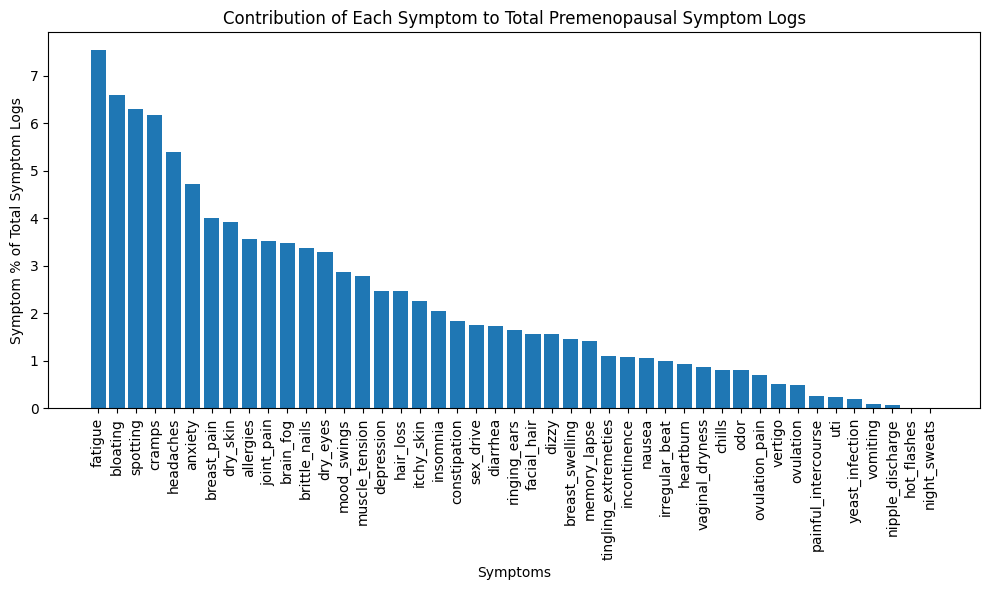

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("Symptom % of Total Symptom Logs")
plt.title("Contribution of Each Symptom to Total Premenopausal Symptom Logs")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Symptom Frequency by % of Users Reporting that Symptom

In [ ]:
# Step 1: Calculate the total number of users
total_users = len(frame)

# Step 2: Calculate the percentage of users who have each symptom
symptom_percentages = (frame.astype(bool).sum() / total_users) * 100

print(symptom_percentages.sort_values(ascending=False))

fatigue                 74.140508
bloating                63.527653
cramps                  56.801196
headaches               52.690583
anxiety                 52.316891
brain_fog               47.309417
joint_pain              43.796712
mood_swings             41.031390
dry_skin                37.892377
breast_pain             36.995516
depression              36.995516
allergies               36.322870
muscle_tension          34.379671
spotting                34.155456
itchy_skin              32.137519
insomnia                29.970105
facial_hair             28.176383
dry_eyes                27.428999
dizzy                   25.186846
constipation            25.186846
brittle_nails           25.112108
sex_drive               25.112108
hair_loss               25.037369
memory_lapse            23.094170
diarrhea                19.581465
tingling_extremeties    19.506726
ringing_ears            18.983558
nausea                  17.937220
breast_swelling         17.189836
incontinence  

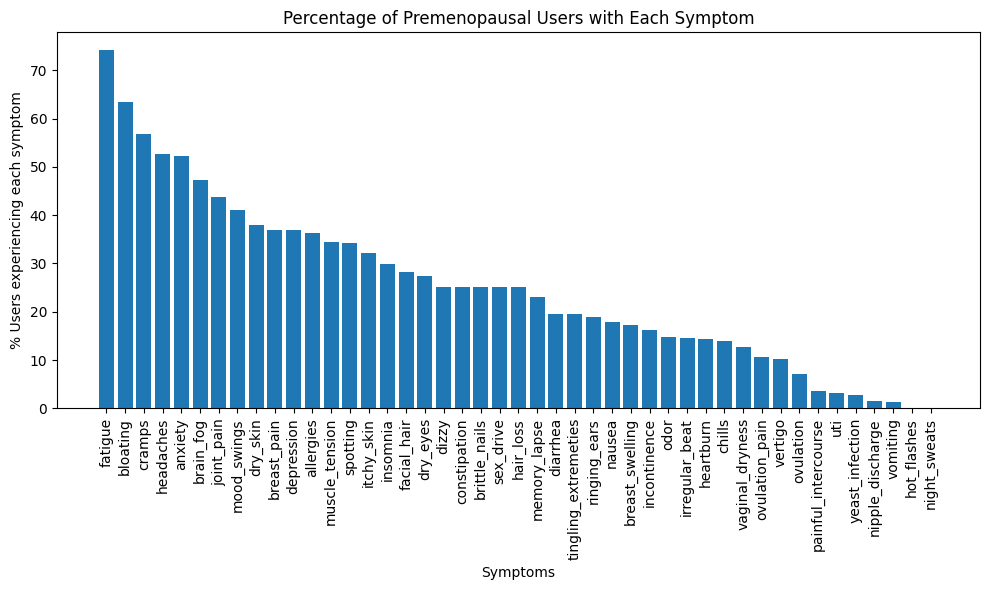

In [ ]:
symptom_percentages_sorted = symptom_percentages.sort_values(ascending=False)

plt.figure(figsize=(10, 6))  # Set the figure size for better visibility
plt.bar(symptom_percentages_sorted.index, symptom_percentages_sorted.values)
plt.xlabel("Symptoms")
plt.ylabel("% Users experiencing each symptom")
plt.title("Percentage of Premenopausal Users with Each Symptom")
plt.xticks(rotation=90)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust the layout to prevent cropping of labels
plt.show()

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms].astype('int64')
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

/home/ubuntu/anaconda3/envs/menolife/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



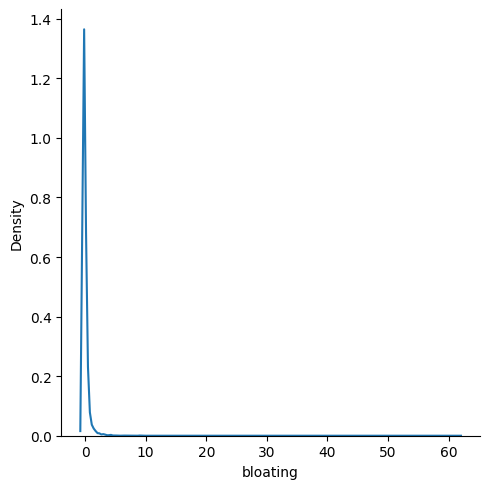

In [ ]:
sns.displot(sframe, x='bloating', kind='kde')

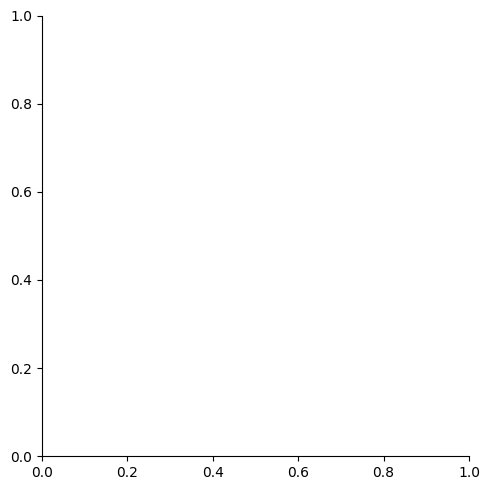

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

In [ ]:
cmatrix = sframe.cov()

# List of symptom names to remove
symptoms_to_remove = ["hot_flashes", "night_sweats"]

# Step 1: Drop the specified rows and columns from the covariance matrix
cmatrix = cmatrix.drop(symptoms_to_remove, axis=0).drop(symptoms_to_remove, axis=1)

# Step 2: Print the filtered covariance matrix
#print(filtered_cmatrix)


In [ ]:
cmatrix.to_csv('csv/premeno_correct_symptom_covariance.csv', index=True)

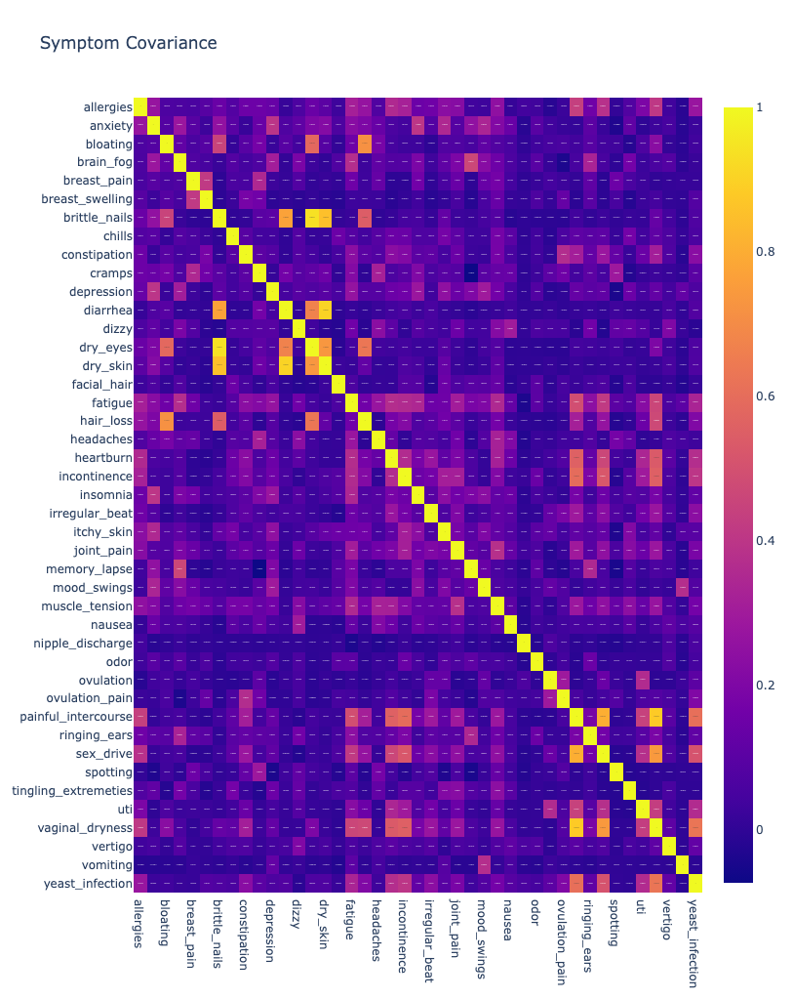

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/premeno__lenient_symptom_covariance.png')

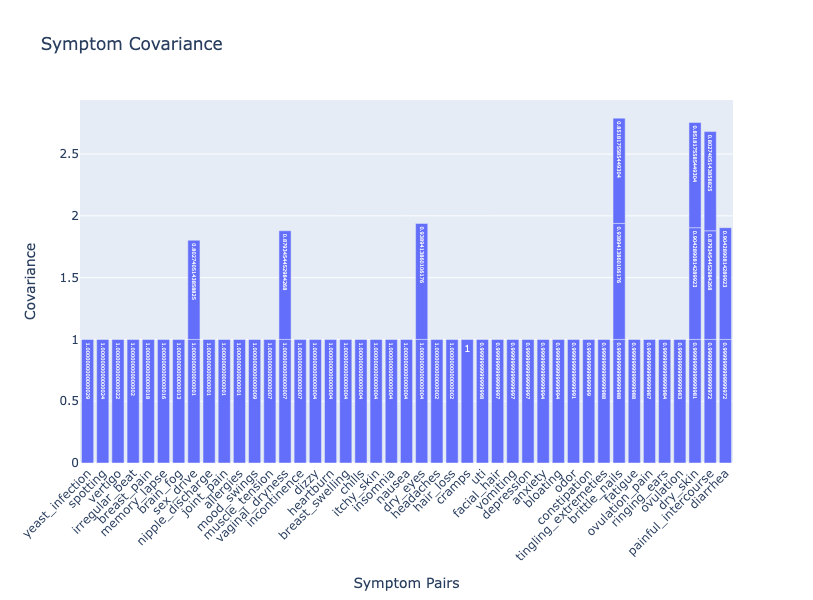

brittle_nails - dry_eyes - 0.9389413860106176
dry_eyes - brittle_nails - 0.9389413860106176
diarrhea - dry_skin - 0.9042890814289923
dry_skin - diarrhea - 0.9042890814289923
painful_intercourse - vaginal_dryness - 0.8793454452984268
vaginal_dryness - painful_intercourse - 0.8793454452984268
brittle_nails - dry_skin - 0.8518175585449304
dry_skin - brittle_nails - 0.8518175585449304
painful_intercourse - sex_drive - 0.8027405143858825
sex_drive - painful_intercourse - 0.8027405143858825
allergies - anxiety - nan
allergies - bloating - nan
allergies - brain_fog - nan
allergies - breast_pain - nan
allergies - breast_swelling - nan
allergies - brittle_nails - nan
allergies - chills - nan
allergies - constipation - nan
allergies - cramps - nan
allergies - depression - nan
allergies - diarrhea - nan
allergies - dizzy - nan
allergies - dry_eyes - nan
allergies - dry_skin - nan
allergies - facial_hair - nan
allergies - fatigue - nan
allergies - hair_loss - nan
allergies - headaches - nan
allerg

In [ ]:
#Alt covariance plot to properly display y axis titles

import plotly.graph_objs as go
import plotly.express as px

th = 0.8
fmatrix = cmatrix[cmatrix >= th]

# Step 1: Remove 'hot_flashes' and 'night_sweats' from the fmatrix
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=0)
#fmatrix = fmatrix.drop(['hot_flashes', 'night_sweats'], axis=1)

# Step 2: Sort the covariance matrix in descending order of covariance
sorted_cov_matrix = fmatrix.unstack().sort_values(ascending=False)

# Step 3: Create a bar graph to visualize the covariance by symptom pair
sorted_cov_matrix_df = sorted_cov_matrix.reset_index()
sorted_cov_matrix_df.columns = ['Symptom 1', 'Symptom 2', 'Covariance']

fig = px.bar(sorted_cov_matrix_df,
             x='Symptom 1',
             y='Covariance',
             text='Covariance',
             title='Symptom Covariance',
             labels={'Symptom 1': 'Symptom Pairs', 'Covariance': 'Covariance'},
             width=1024,
             height=600)
fig.update_layout(xaxis_tickangle=-45)  # Rotate x-axis labels for better readability
fig.show()

# Step 4: Create a dictionary to store the counts of each symptom pair
symptom_pair_counts = {}

# Step 5: Iterate through the sorted DataFrame to count occurrences of each symptom pair
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        symptom_pair = f"{symptom1} - {symptom2}"
        count = fmatrix.loc[symptom1, symptom2]
        symptom_pair_counts[symptom_pair] = count

        
# Step 4: Print out the symptom pairs in order from highest to lowest covariance
for _, row in sorted_cov_matrix_df.iterrows():
    symptom1 = row['Symptom 1']
    symptom2 = row['Symptom 2']
    covariance = row['Covariance']
    if not (symptom1 == symptom2):
        print(f'{symptom1} - {symptom2} - {covariance}') #uncomment me to run

## Find pairs of symptoms with more than 80% corelation.

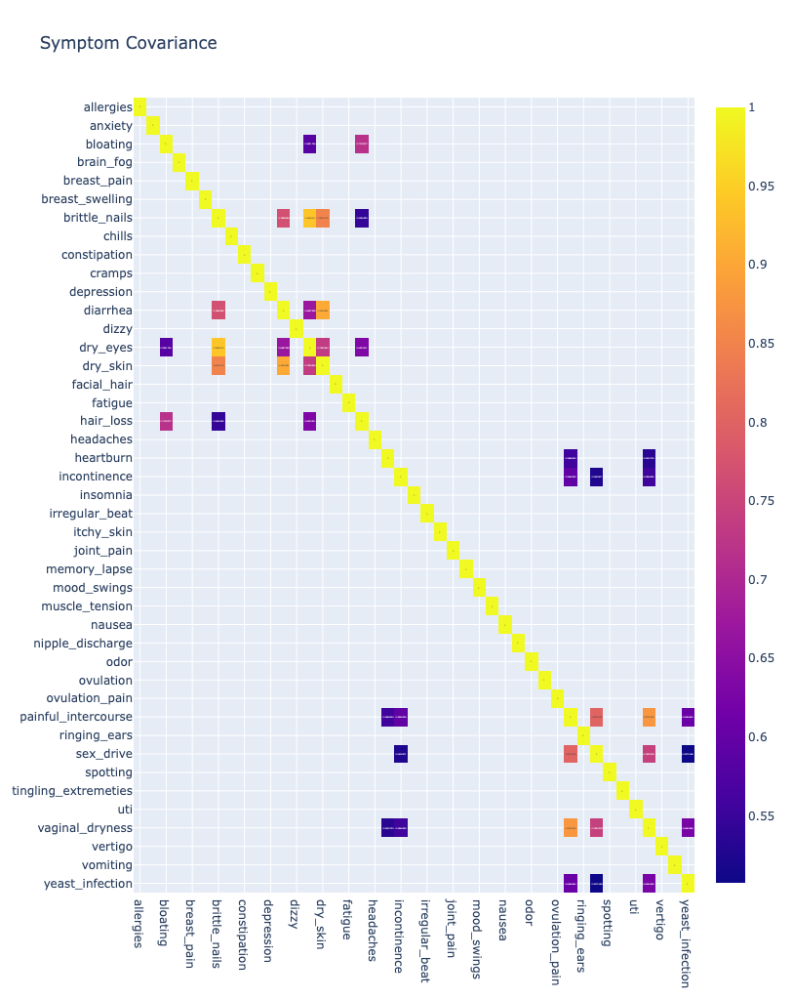

bloating - dry_eyes - 0.5831746063703612
bloating - hair_loss - 0.7178277012761545
brittle_nails - diarrhea - 0.7689483824247916
brittle_nails - dry_eyes - 0.9389413860106176
brittle_nails - dry_skin - 0.8518175585449304
brittle_nails - hair_loss - 0.5446554916119984
diarrhea - brittle_nails - 0.7689483824247916
diarrhea - dry_eyes - 0.6687388549370163
diarrhea - dry_skin - 0.9042890814289923
dry_eyes - bloating - 0.5831746063703612
dry_eyes - brittle_nails - 0.9389413860106176
dry_eyes - diarrhea - 0.6687388549370163
dry_eyes - dry_skin - 0.734952424069575
dry_eyes - hair_loss - 0.6323511145932891
dry_skin - brittle_nails - 0.8518175585449304
dry_skin - diarrhea - 0.9042890814289923
dry_skin - dry_eyes - 0.734952424069575
hair_loss - bloating - 0.7178277012761545
hair_loss - brittle_nails - 0.5446554916119984
hair_loss - dry_eyes - 0.6323511145932891
heartburn - painful_intercourse - 0.5568533899043797
heartburn - vaginal_dryness - 0.5330733039160824
incontinence - painful_intercourse

In [ ]:
import pandas as pd
import plotly.express as px

th=0.5

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and print it out.
        for p in paired:
            if not (s == p):
                print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))


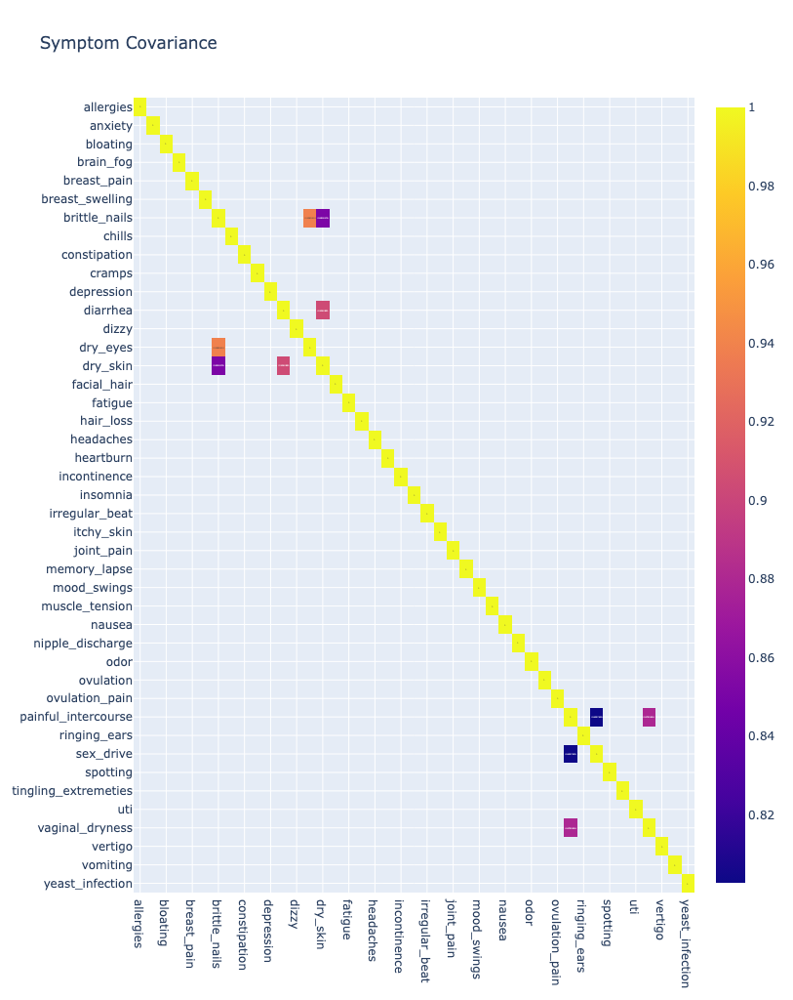

              Symptom1             Symptom2  Covariance
0        brittle_nails             dry_eyes    0.938941
3             dry_eyes        brittle_nails    0.938941
2             diarrhea             dry_skin    0.904289
5             dry_skin             diarrhea    0.904289
7  painful_intercourse      vaginal_dryness    0.879345
9      vaginal_dryness  painful_intercourse    0.879345
1        brittle_nails             dry_skin    0.851818
4             dry_skin        brittle_nails    0.851818
6  painful_intercourse            sex_drive    0.802741
8            sex_drive  painful_intercourse    0.802741


In [ ]:
import pandas as pd
import plotly.express as px

th = 0.8

fmatrix = cmatrix[cmatrix >= th]

# create the heatmap with the updated 'fmatrix'
fig = px.imshow(fmatrix,
                width=1024,
                height=1024,
                text_auto=True,
                aspect='auto',
                title='Symptom Covariance')
fig.show()

# Create an empty list to store the results
covariance_results = []

indexes = fmatrix.index.values
for s in symptoms:
    if s not in ['hot_flashes', 'night_sweats']:  # Exclude 'hot_flashes' and 'night_sweats' from iteration
        paired = fmatrix[s].dropna().index.values
        # We can go ahead and calculate the covariance and store the results in the list.
        for p in paired:
            if not (s == p):
                covariance = fmatrix.loc[s][p]
                covariance_results.append({'Symptom1': s, 'Symptom2': p, 'Covariance': covariance})

# Convert the list to a DataFrame
covariance_results_df = pd.DataFrame(covariance_results)

# Sort the DataFrame by the 'Covariance' column in descending order
covariance_results_df = covariance_results_df.sort_values(by='Covariance', ascending=False)

# Print the sorted results
print(covariance_results_df)


### Notes

With super users filtered out -- there are MUCH weaker pairwise correlations.

## Cluster Map

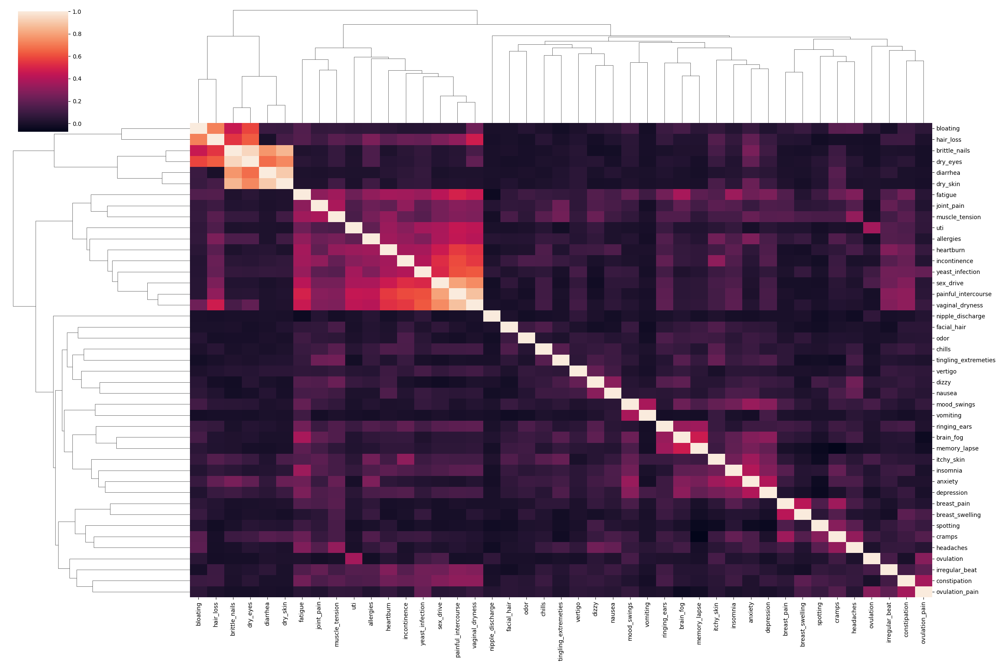

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
#Note nothing to see from ARI or DBS. We don't have predetermined labels to compare to. 

# Step 1:  extract clustering labels
clustering_labels = hcluster.dendrogram_row.reordered_ind

# Step 2: Calculate ARI for different numbers of clusters (k)
max_clusters = 10  # Choose the maximum number of clusters to evaluate
ari_scores = []

for k in range(2, max_clusters + 1):
    # Replace 'KMeans' with your preferred clustering algorithm (e.g., DBSCAN)
    kmeans = KMeans(n_clusters=k, n_init=50, random_state=42)
    predicted_labels = kmeans.fit_predict(cmatrix)
    ari = adjusted_rand_score(clustering_labels, predicted_labels)
    ari_scores.append(ari)
    print(f"ARI for k={k}: {ari:.4f}")

# Step 3: Find the optimal number of clusters based on the ARI scores
optimal_k = ari_scores.index(max(ari_scores)) + 2  # Add 2 to account for k=2 being the starting value

print("Optimal number of clusters:", optimal_k)

# Use the optimal number of clusters for visualization or further analysis
# For example, you can run k-means again with optimal_k and plot the results.

ARI for k=2: 0.0000
ARI for k=3: 0.0000
ARI for k=4: 0.0000
ARI for k=5: 0.0000
ARI for k=6: 0.0000
ARI for k=7: 0.0000
ARI for k=8: 0.0000
ARI for k=9: 0.0000
ARI for k=10: 0.0000
Optimal number of clusters: 2


In [ ]:
#Let's use silhouette score instead here. 
import numpy as np
import pandas as pd
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import seaborn as sns

# Get the cluster assignments from the Seaborn plot
cluster_assignments = hcluster.dendrogram_row.reordered_ind

# Convert the cluster assignments to a NumPy array
cluster_assignments = np.array(cluster_assignments)

# Calculate the silhouette scores for different numbers of clusters
max_clusters = 10  # Set a reasonable maximum number of clusters to consider
silhouette_scores = []

for num_clusters in range(2, max_clusters + 1):
    # Perform hierarchical clustering with 'num_clusters'
    cluster_model = AgglomerativeClustering(n_clusters=num_clusters, linkage='ward')
    cluster_model.fit(cmatrix)
    
    # Calculate the silhouette score for the current number of clusters
    score = silhouette_score(cmatrix, cluster_model.labels_)
    silhouette_scores.append(score)

# Find the optimal number of clusters that maximizes the silhouette score
optimal_num_clusters = np.argmax(silhouette_scores) + 2  # Adding 2 because range starts from 2

print("Optimal number of clusters:", optimal_num_clusters)


Optimal number of clusters: 2


In [ ]:
#Lol, no wonder, clusters are so weak for the premenopausal group! It's basically vague PMS

In [ ]:
hcluster.savefig('figures/premeno_symptom_co_hirach.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.53, 0.53
PCA2 - 0.13, 0.66
PCA3 - 0.10, 0.75
PCA4 - 0.05, 0.80
PCA5 - 0.03, 0.83
PCA6 - 0.02, 0.85
PCA7 - 0.02, 0.87
PCA8 - 0.02, 0.89
PCA9 - 0.01, 0.90
PCA10 - 0.01, 0.91
PCA11 - 0.01, 0.92
PCA12 - 0.01, 0.93
PCA13 - 0.01, 0.93
PCA14 - 0.01, 0.94
PCA15 - 0.01, 0.95


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(1338, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

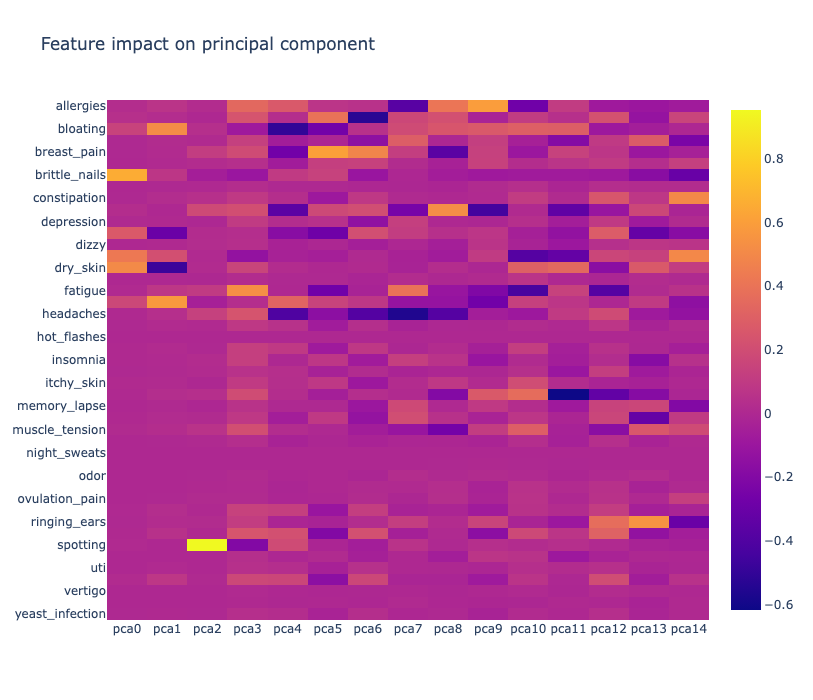

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

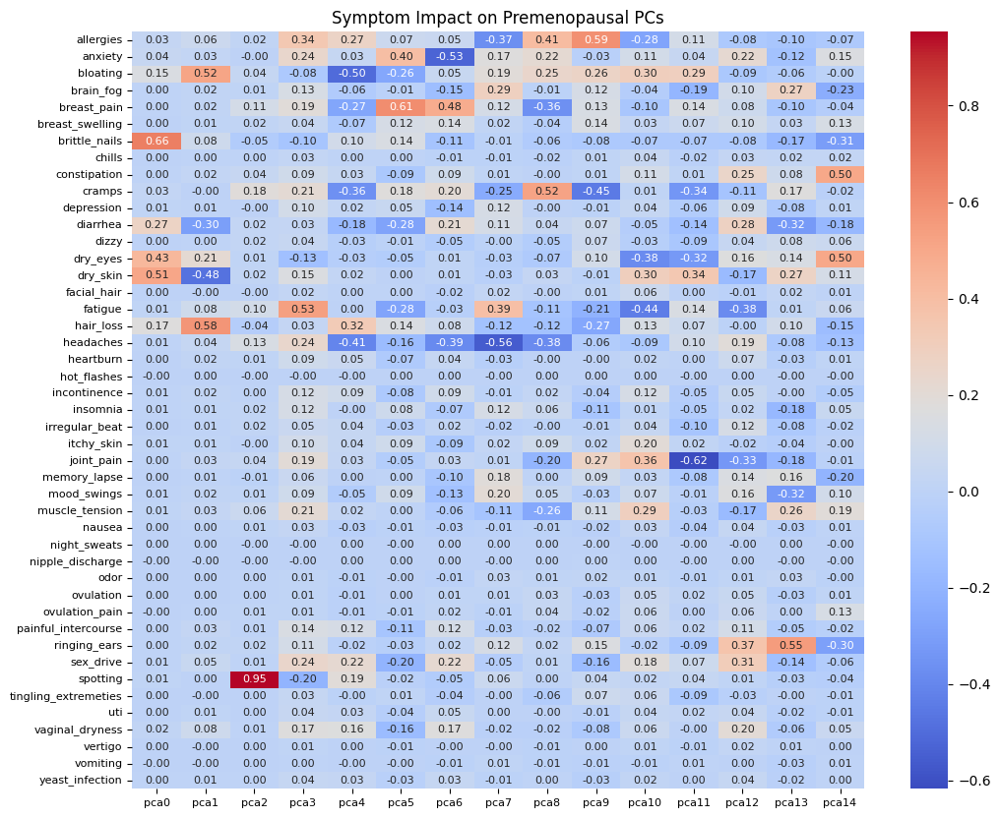

In [ ]:
#Alt plot that shows every row label

import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you already have the impact DataFrame 'impact' from your code
# impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

# Create a heatmap using seaborn and matplotlib
plt.figure(figsize=(12, 10))
sns.heatmap(impact, cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 8})

# Adjust the font size of x-axis and y-axis tick labels
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Set the title and adjust its font size
plt.title('Symptom Impact on Premenopausal PCs', fontsize=12)

plt.show()

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=9, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(1338, 9)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

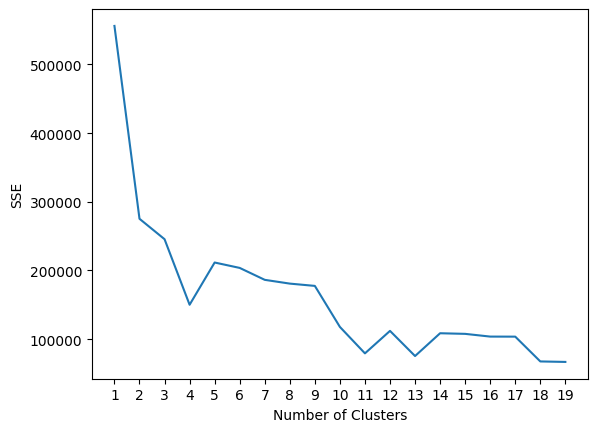

In [ ]:
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **3**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

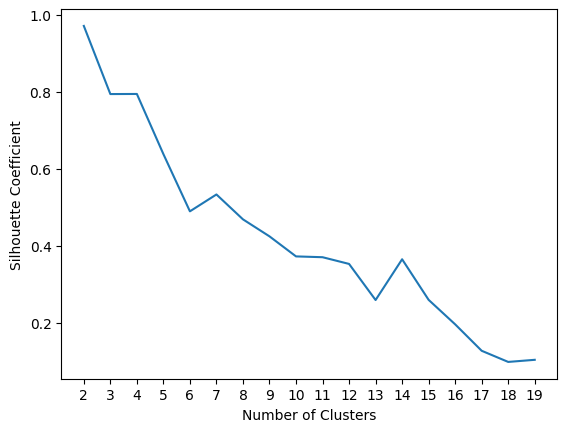

In [ ]:
plt.plot(range(2, 20), silhouette_coefficients)
plt.xticks(range(2, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

4

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=5.
n=3 might be too small of a number of clusters. We will pick n=5 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=5, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 1195
1 - 53
2 - 3
3 - 3
4 - 84


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=10):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where}
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:

## If the block above throws an error - use this. 
def getTopSymptoms(users, top=10):
    if len(users) == 0:
        return pd.DataFrame(columns=['name', 'occ'])  # Return an empty DataFrame if no users in the segment
    
    where_query = "uid IN ('{}')".format("','".join(users))
    
    query = """
        SELECT name, COUNT(name) AS occ FROM symptoms 
        WHERE {where}
        GROUP BY name
        ORDER BY occ DESC
        LIMIT {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    return results


In [ ]:
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Segment 0
['fatigue' 'bloating' 'cramps' 'headaches' 'anxiety' 'brain_fog'
 'joint_pain' 'spotting' 'allergies' 'breast_pain']
Segment 1
['spotting' 'cramps' 'headaches' 'breast_pain' 'fatigue' 'muscle_tension'
 'bloating' 'dry_skin' 'mood_swings' 'allergies']
Segment 2
['brittle_nails' 'dry_eyes' 'dry_skin' 'hair_loss' 'bloating' 'diarrhea'
 'anxiety' 'allergies' 'cramps' 'itchy_skin']
Segment 3
['spotting' 'cramps' 'dry_eyes' 'fatigue' 'headaches' 'constipation'
 'bloating' 'joint_pain' 'breast_pain' 'dizzy']
Segment 4
['fatigue' 'bloating' 'breast_pain' 'cramps' 'headaches' 'anxiety'
 'allergies' 'joint_pain' 'mood_swings' 'brain_fog']


Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

0 - 5825
1 - 1
2 - 2


InvalidRequestException: An error occurred (InvalidRequestException) when calling the StartQueryExecution operation: 